# Initial

In [2]:
#B1
!pip install mne numpy matplotlib scikit-learn mne-bids

ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: 'c:\\users\\cesar\\anaconda3\\envs\\pytorch\\lib\\site-packages\\numpy-1.26.4.dist-info\\METADATA'



In [3]:
#B2
# --- Import necessary libraries
import pandas as pd
import numpy as np
from scipy.io import loadmat
import matplotlib.pyplot as plt
import mne
from mne.decoding import SSD
import gc
from turtle import color
from matplotlib.cm import get_cmap
#from mne_bids import BIDSPath, read_raw_bids
from scipy.io import loadmat
import mne
from mne.viz import plot_alignment, snapshot_brain_montage
from mne.time_frequency import fit_iir_model_raw
import gc
from scipy import signal

# --- Load the .mat file (change filename if needed)
data = loadmat("ECoG_Handpose.mat")



# One Channel


In [4]:
#B3
# --- Channel information
"""
CH1: sample time
CH2-61: ECoG (raw and DC-coupled; recorded from right sensorimotor cortex)
CH62: paradigm info (0 = relax, 1 = fist, 2 = peace, 3 = open hand)
CH63-67: data glove finger movements (thumb to little)
"""
"""
# Convert data to a pandas DataFrame
data_only = pd.DataFrame(data['y'])
del data  # free memory

# Transpose the DataFrame so channels are represented as columns
data_only = data_only.T  # Transpose before assigning column names

# --- Set column names for channels
col_names = [f'CH_{i}' for i in range(1, 62)]
col_names.extend(['paradigm_info','data_glove_thumb', 'data_glove_index','data_glove_middle', 'data_glove_ring', 'data_glove_little'])
data_only.columns = col_names # Now the number of columns matches the length of col_names """

"\n# Convert data to a pandas DataFrame\ndata_only = pd.DataFrame(data['y'])\ndel data  # free memory\n\n# Transpose the DataFrame so channels are represented as columns\ndata_only = data_only.T  # Transpose before assigning column names\n\n# --- Set column names for channels\ncol_names = [f'CH_{i}' for i in range(1, 62)]\ncol_names.extend(['paradigm_info','data_glove_thumb', 'data_glove_index','data_glove_middle', 'data_glove_ring', 'data_glove_little'])\ndata_only.columns = col_names # Now the number of columns matches the length of col_names "

In [5]:
#B4
"""
data_only.iloc[:,0]"""

'\ndata_only.iloc[:,0]'

In [6]:
#B5
# --- View summary statistics for 1 channel
'''data_only.iloc[:, 0].describe()'''

'data_only.iloc[:, 0].describe()'

In [7]:
#B6
# --- Separate ECoG features and labels
'''X = data_only.iloc[:, :62]  # CH_1 to CH_61 (including time)
y = data_only['paradigm_info']

plt.figure( figsize=(10, 5))
plt.plot(X.iloc[:, 0], X.iloc[:, 26])
plt.xlabel('Time (s)')
plt.ylabel('CH_27')
plt.xlim(100, 200)
plt.ylim(-25000, -15000)
plt.title('Time Series of CH_27')
plt.show()


plt.tight_layout()
plt.savefig('CH_27.jpg')
plt.show()'''

"X = data_only.iloc[:, :62]  # CH_1 to CH_61 (including time)\ny = data_only['paradigm_info']\n\nplt.figure( figsize=(10, 5))\nplt.plot(X.iloc[:, 0], X.iloc[:, 26])\nplt.xlabel('Time (s)')\nplt.ylabel('CH_27')\nplt.xlim(100, 200)\nplt.ylim(-25000, -15000)\nplt.title('Time Series of CH_27')\nplt.show()\n\n\nplt.tight_layout()\nplt.savefig('CH_27.jpg')\nplt.show()"

In [8]:
#B7
'''X'''

'X'

# Load Mat



In [9]:
#B8
# --- Channel information
"""
CH1: sample time
CH2-61: ECoG (raw and DC-coupled; recorded from right sensorimotor cortex)
CH62: paradigm info (0 = relax, 1 = fist, 2 = peace, 3 = open hand)
CH63-67: data glove finger movements (thumb to little)
"""
# Load the .mat file (change filename if needed)
# Assuming the file is in the current directory or the path is specified correctly.
from scipy.io import loadmat
data = loadmat("ECoG_Handpose.mat")

# Convert data to a pandas DataFrame
data_only = pd.DataFrame(data['y'])
del data  # free memory

# Transpose the DataFrame so channels are represented as columns
data_only = data_only.T  # Transpose before assigning column names

# --- Set column names for channels
col_names = [f'CH_{i}' for i in range(1, 62)]
col_names.extend(['paradigm_info','data_glove_thumb', 'data_glove_index','data_glove_middle', 'data_glove_ring', 'data_glove_little'])
data_only.columns = col_names # Now the number of columns matches the length of col_names

In [10]:
#B9
# --- View summary statistics for paradigm and glove data
data_only.iloc[:, 61:].describe()


,paradigm_info,data_glove_thumb,data_glove_index,data_glove_middle,data_glove_ring,data_glove_little
count,507025.000000,507025.000000,507025.000000,507025.000000,507025.000000,507025.000000
mean,0.868502,0.518840,0.247886,0.203706,0.399274,0.267168
std,1.127756,0.172327,0.301131,0.209798,0.346444,0.234756
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.329293,0.075524,0.093363,0.158796,0.085878
50%,0.000000,0.573737,0.134398,0.134209,0.177778,0.173664
75%,2.000000,0.662626,0.221395,0.180160,0.918519,0.433206
max,3.000000,0.791919,1.000000,0.824216,0.980093,1.000000


In [11]:
#B10
# --- Separate ECoG features and labels
X = data_only.iloc[:, :62]  # CH_1 to CH_61 (including time)
y = data_only['paradigm_info']
print(X.columns)
del data_only  # free memory


Index(['CH_1', 'CH_2', 'CH_3', 'CH_4', 'CH_5', 'CH_6', 'CH_7', 'CH_8', 'CH_9',
       'CH_10', 'CH_11', 'CH_12', 'CH_13', 'CH_14', 'CH_15', 'CH_16', 'CH_17',
       'CH_18', 'CH_19', 'CH_20', 'CH_21', 'CH_22', 'CH_23', 'CH_24', 'CH_25',
       'CH_26', 'CH_27', 'CH_28', 'CH_29', 'CH_30', 'CH_31', 'CH_32', 'CH_33',
       'CH_34', 'CH_35', 'CH_36', 'CH_37', 'CH_38', 'CH_39', 'CH_40', 'CH_41',
       'CH_42', 'CH_43', 'CH_44', 'CH_45', 'CH_46', 'CH_47', 'CH_48', 'CH_49',
       'CH_50', 'CH_51', 'CH_52', 'CH_53', 'CH_54', 'CH_55', 'CH_56', 'CH_57',
       'CH_58', 'CH_59', 'CH_60', 'CH_61', 'paradigm_info'],
      dtype='object')


In [12]:
from scipy.io import loadmat
data = loadmat("ECoG_Handpose.mat")

# Convert data to a pandas DataFrame
data_only = pd.DataFrame(data['y'])
del data  # free memory

# Transpose the DataFrame so channels are represented as columns
data_only = data_only.T

# --- Set column names for channels
col_names = [f'CH_{i}' for i in range(1, 62)]
col_names.extend(['paradigm_info','data_glove_thumb', 'data_glove_index','data_glove_middle', 'data_glove_ring', 'data_glove_little'])
data_only.columns = col_names

# Correlacionar solo canales CH_2 a CH_61 (CH_1 es tiempo y se excluye)


In [13]:
# Correlacionar solo canales CH_2 a CH_61 (CH_1 es tiempo y se excluye)
ecog_channels = data_only.iloc[:, 1:61]  # Excluye CH_1
correlation_matrix = ecog_channels.corr()

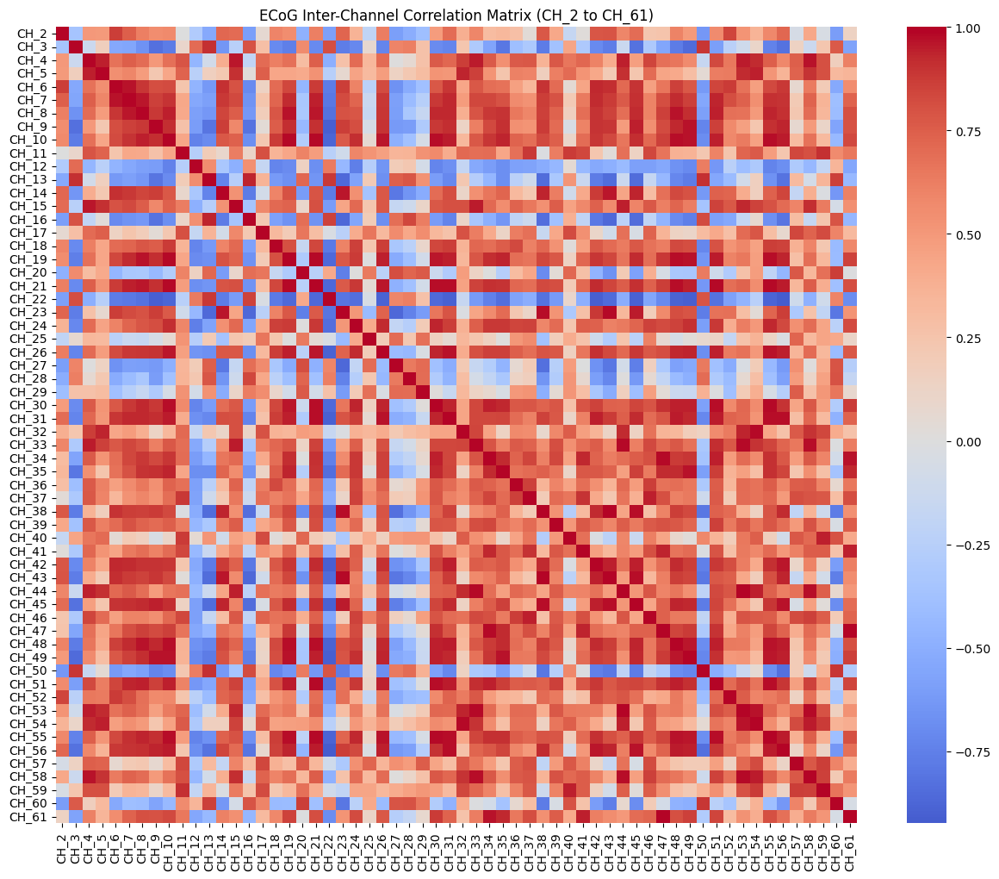

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 12))
sns.heatmap(correlation_matrix, cmap='coolwarm', center=0)
plt.title('ECoG Inter-Channel Correlation Matrix (CH_2 to CH_61)')
plt.show()


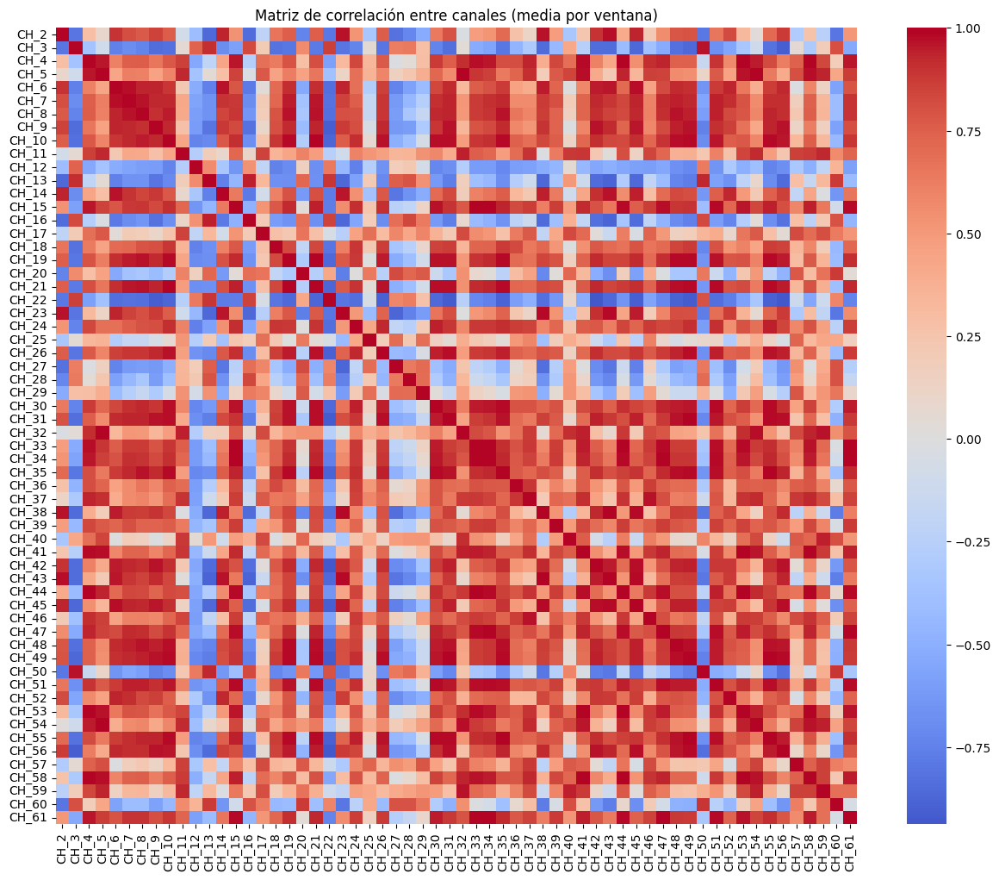

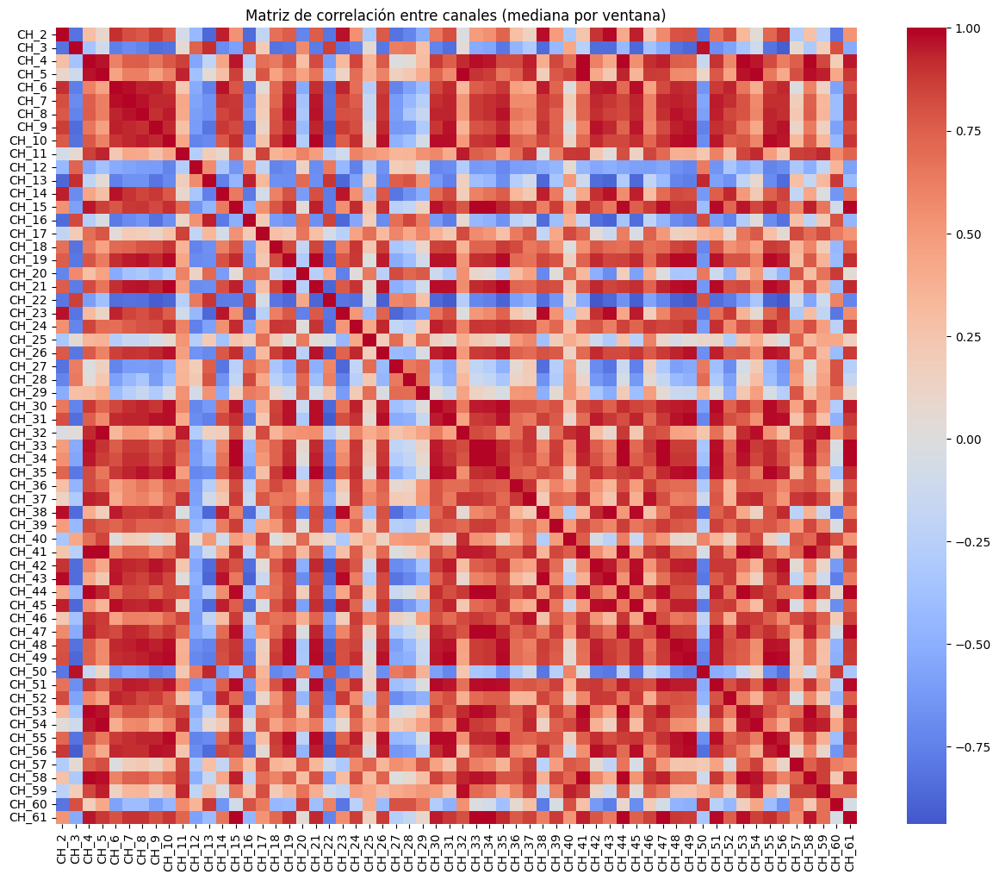

In [15]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- Parámetros
window_size = 1200  # Tamaño de ventana (puede cambiarlo)
num_channels = 60   # CH_2 a CH_61 (índices 1:61)

# --- Extraer datos ECoG (excluyendo tiempo)
ecog_channels = data_only.iloc[:, 1:61]

# --- Dividir en ventanas y calcular media
means = []
medians = []
for start in range(0, len(ecog_channels), window_size):
    window = ecog_channels.iloc[start:start+window_size]
    if len(window) == window_size:  # Solo ventanas completas
        means.append(window.mean().values)
        medians.append(window.median().values)

# Convertimos listas a DataFrames
means_df = pd.DataFrame(means, columns=ecog_channels.columns)
medians_df = pd.DataFrame(medians, columns=ecog_channels.columns)

# --- Correlación entre canales usando medias
corr_means = means_df.corr()
plt.figure(figsize=(15, 12))
sns.heatmap(corr_means, cmap='coolwarm', center=0)
plt.title('Matriz de correlación entre canales (media por ventana)')
plt.show()

# --- Correlación entre canales usando medianas
corr_medians = medians_df.corr()
plt.figure(figsize=(15, 12))
sns.heatmap(corr_medians, cmap='coolwarm', center=0)
plt.title('Matriz de correlación entre canales (mediana por ventana)')
plt.show()


In [16]:
# Comparar si las matrices son exactamente iguales
are_equal = corr_means.equals(corr_medians)
print("¿Son las matrices exactamente iguales?", are_equal)

# Ver diferencia absoluta media
diff = (corr_means - corr_medians).abs()
print("Diferencia media entre matrices:", diff.mean().mean())

# Mostrar los valores mayores de diferencia
print("Diferencias mayores a 0.01:")
print(diff[diff > 0.01].dropna(how='all').dropna(axis=1, how='all'))


¿Son las matrices exactamente iguales? False
Diferencia media entre matrices: 0.0025840544214419544
Diferencias mayores a 0.01:
           CH_2      CH_3      CH_5      CH_9     CH_10     CH_12     CH_16  \
CH_2        NaN  0.015588       NaN  0.012805  0.011822  0.014156  0.012344   
CH_3   0.015588       NaN  0.010358       NaN       NaN       NaN       NaN   
CH_5        NaN  0.010358       NaN       NaN       NaN  0.013035  0.011811   
CH_9   0.012805       NaN       NaN       NaN       NaN       NaN       NaN   
CH_10  0.011822       NaN       NaN       NaN       NaN       NaN       NaN   
CH_12  0.014156       NaN  0.013035       NaN       NaN       NaN       NaN   
CH_16  0.012344       NaN  0.011811       NaN       NaN       NaN       NaN   
CH_18  0.010903       NaN  0.011409       NaN       NaN       NaN       NaN   
CH_19  0.011700       NaN       NaN       NaN       NaN       NaN       NaN   
CH_22  0.013666       NaN  0.012499       NaN       NaN       NaN       NaN   
CH_

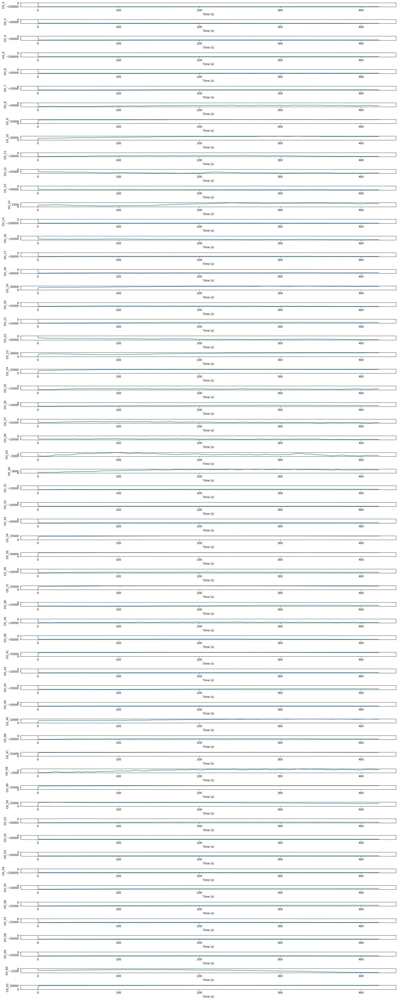

In [17]:
# --- Plot downsampled time series for each channel
fig, ax = plt.subplots(60, 1, figsize=(20, 50))
ax = ax.ravel()

for i in range(1, 61):  # Skip channel 0 (time)
    ax[i-1].plot(X.iloc[::1200, 0], X.iloc[::1200, i])
    ax[i-1].set_xlabel('Time (s)')
    ax[i-1].set_ylabel(col_names[i])

plt.tight_layout()
plt.savefig('Initial_view.jpg')
plt.show()


# Three events analysis


In [18]:
"""
CH1: sample time
CH2-61: ECoG (raw and DC-coupled; recorded from right sensorimotor cortex)
CH62: paradigm info (0 = relax, 1 = fist, 2 = peace, 3 = open hand)
CH63-67: data glove finger movements (thumb to little)
"""

# --- Load the .mat file (change filename if needed)
data = loadmat("ECoG_Handpose.mat")

# Convert data to a pandas DataFrame
data_only = pd.DataFrame(data['y'])
del data  # free memory

# Transpose the DataFrame so channels are represented as columns
data_only = data_only.T  # Transpose before assigning column names

# --- Set column names for channels
col_names = [f'CH_{i}' for i in range(1, 62)]
col_names.extend(['paradigm_info','data_glove_thumb', 'data_glove_index','data_glove_middle', 'data_glove_ring', 'data_glove_little'])
data_only.columns = col_names # Now the number of columns matches the length of col_names

# --- Separate ECoG features and labels
X = data_only.iloc[:, :62]  # CH_1 to CH_61 (including time)
y = data_only['paradigm_info']

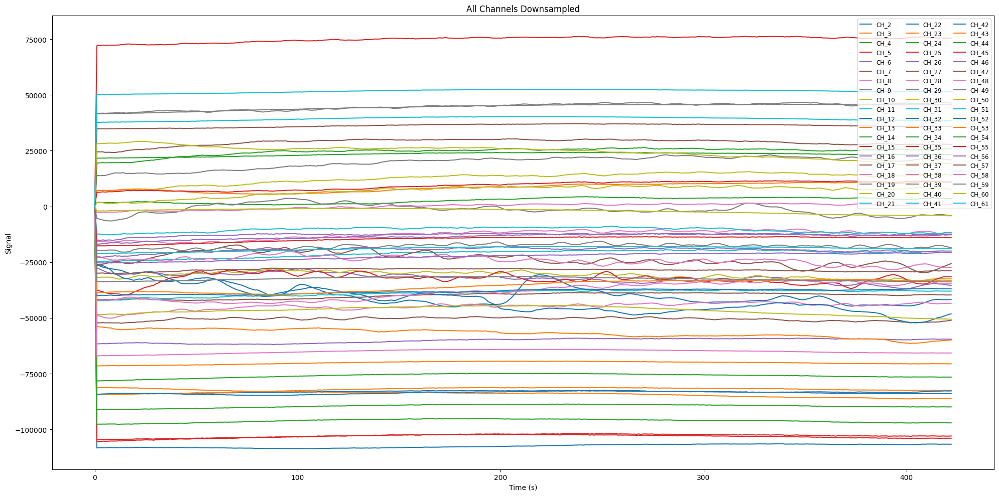

In [19]:
# --- Plot all downsampled channels in a single graph
plt.figure(figsize=(20, 10))

# Asumiendo que la columna 0 es el tiempo
time = X.iloc[::1200, 0]

# Graficar todos los canales sobre el mismo eje
for i in range(1, 61):  # Saltamos la columna de tiempo
    plt.plot(time, X.iloc[::1200, i], label=col_names[i])

plt.xlabel('Time (s)')
plt.ylabel('Signal')
plt.title('All Channels Downsampled')
plt.legend(loc='upper right', ncol=3, fontsize='small')
plt.tight_layout()
plt.savefig('All_channels_view.jpg')
plt.show()


Eventos detectados:
   sample  dummy  label label_name
0   14496      0      3  open_hand
1   20256      0      1       fist
2   26112      0      3  open_hand
3   31680      0      2      peace
4   37440      0      2      peace
Creating RawArray with float64 data, n_channels=1, n_times=507025
    Range : 0 ... 507024 =      0.000 ...   422.520 secs
Ready.
Using matplotlib as 2D backend.


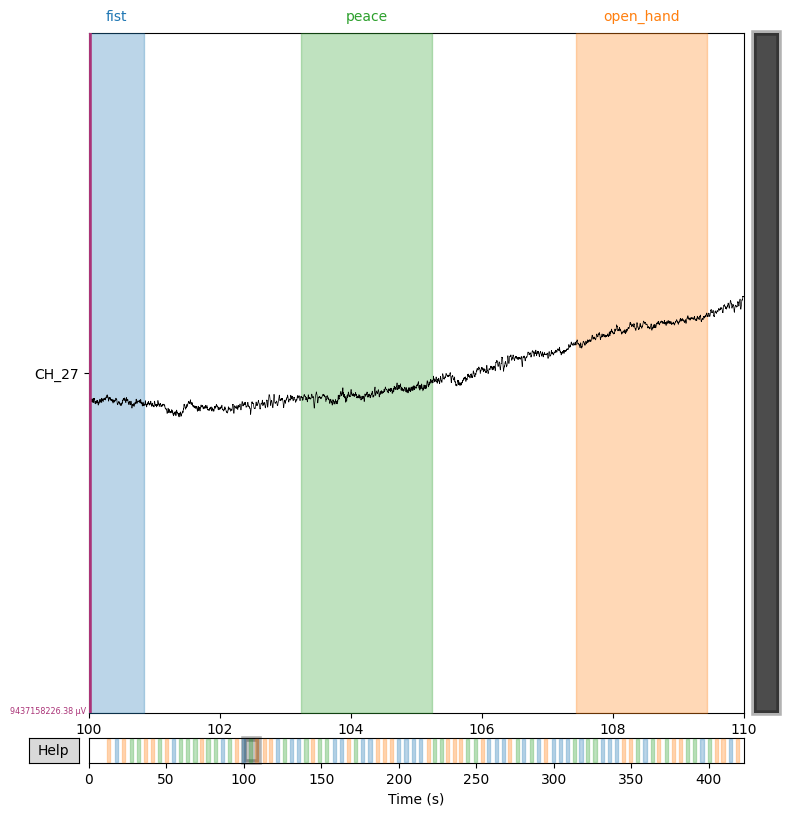

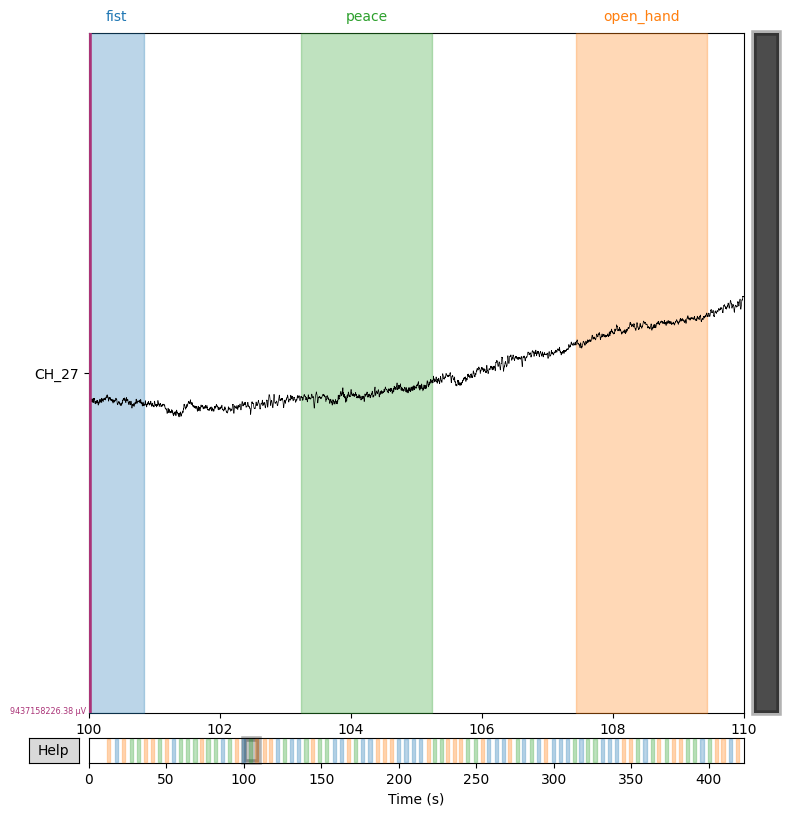

In [20]:
import mne
import pandas as pd
import numpy as np

# --- Crear eventos a partir del canal 'paradigm_info'
events = []
last_label = 0
for i, label in enumerate(y):
    if label != last_label and label in [1, 2, 3]:  # ignorar el estado 0 (relax)
        events.append([i, 0, int(label)])
    last_label = label
events = np.array(events)

# --- Crear DataFrame
event_df = pd.DataFrame(events, columns=['sample', 'dummy', 'label'])
event_df['label_name'] = event_df['label'].map({1: 'fist', 2: 'peace', 3: 'open_hand'})
print("Eventos detectados:")
print(event_df.head())

# --- Guardar CSV
event_df.to_csv('ecog_events.csv', index=False)

# --- Crear RawArray para CH_27
sfreq = 1200  # Frecuencia de muestreo
info = mne.create_info(ch_names=['CH_27'], sfreq=sfreq, ch_types=['ecog'])
raw = mne.io.RawArray(X.iloc[:, 26].values[np.newaxis, :], info)

# --- Convertir eventos a anotaciones (duración de 2 segundos)
onsets = events[:, 0] / sfreq
durations = np.full(len(onsets), 2.0)  # 2 segundos por evento
descriptions = event_df['label_name'].tolist()
annotations = mne.Annotations(onset=onsets, duration=durations, description=descriptions)
raw.set_annotations(annotations)

# --- Visualización
raw.plot(start=100, duration=10, scalings='auto', title="CH_27 con anotaciones de eventos")


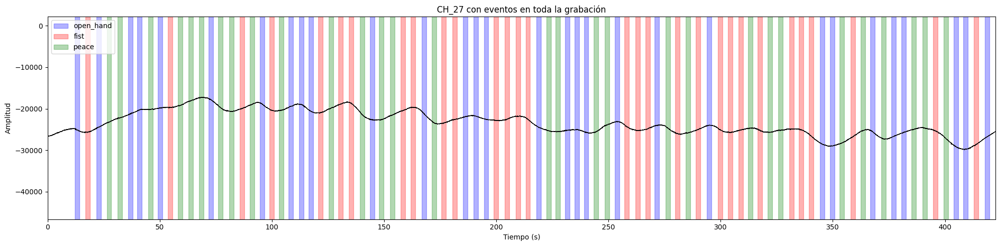

In [21]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# --- Ploteo completo de la señal con ventanas de eventos
n_samples = X.shape[0]
time_axis = np.arange(n_samples) / sfreq  # eje x en segundos
signal = X.iloc[:, 26].values  # CH_27

# --- Crear figura
fig, ax = plt.subplots(figsize=(20, 5))
ax.plot(time_axis, signal, color='black', linewidth=0.5)

# --- Añadir ventanas
colors = {'fist': 'red', 'peace': 'green', 'open_hand': 'blue'}
for _, row in event_df.iterrows():
    onset_sec = row['sample'] / sfreq
    ax.axvspan(onset_sec, onset_sec + 2, color=colors[row['label_name']], alpha=0.3, label=row['label_name'])

# --- Eliminar duplicados en la leyenda
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys())

# --- Configurar gráfico
ax.set_title("CH_27 con eventos en toda la grabación")
ax.set_xlabel("Tiempo (s)")
ax.set_ylabel("Amplitud")
ax.set_xlim(0, time_axis[-1])
plt.tight_layout()
plt.show()


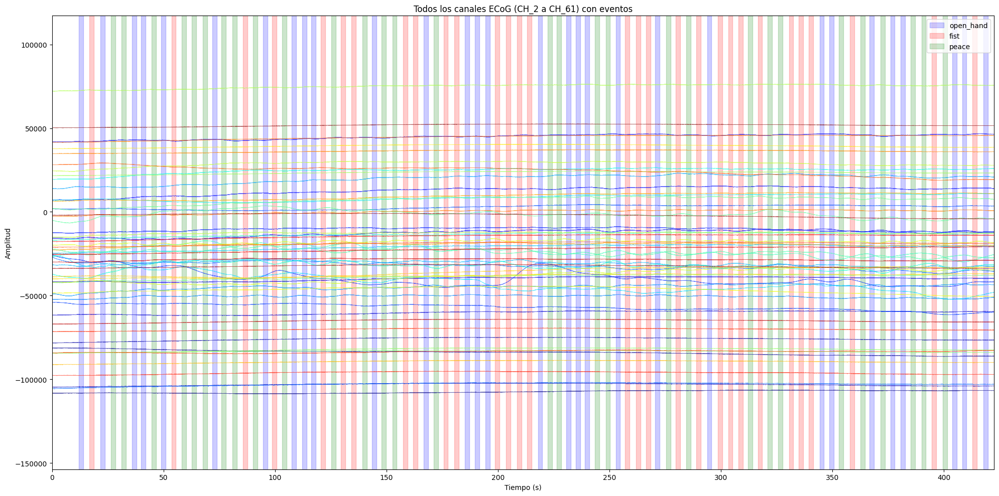

In [22]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# --- Parámetros
n_samples = X.shape[0]
n_channels = 60  # CH_2 a CH_61
time_axis = np.arange(n_samples) / sfreq
colors = plt.cm.jet(np.linspace(0, 1, n_channels))  # colores para canales
event_colors = {'fist': 'red', 'peace': 'green', 'open_hand': 'blue'}

# --- Crear figura
fig, ax = plt.subplots(figsize=(20, 10))

# --- Graficar todos los canales con transparencia
for i in range(n_channels):
    channel_data = X.iloc[:, i+1].values  # CH_2 a CH_61
    ax.plot(time_axis, channel_data, color=colors[i], alpha=0.6, linewidth=0.6)

# --- Añadir ventanas de eventos
for _, row in event_df.iterrows():
    onset_sec = row['sample'] / sfreq
    ax.axvspan(onset_sec, onset_sec + 2, color=event_colors[row['label_name']], alpha=0.2, label=row['label_name'])

# --- Eliminar duplicados en la leyenda
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), loc='upper right')

# --- Configurar gráfico
ax.set_title("Todos los canales ECoG (CH_2 a CH_61) con eventos")
ax.set_xlabel("Tiempo (s)")
ax.set_ylabel("Amplitud")
ax.set_xlim(0, time_axis[-1])
plt.tight_layout()
plt.show()


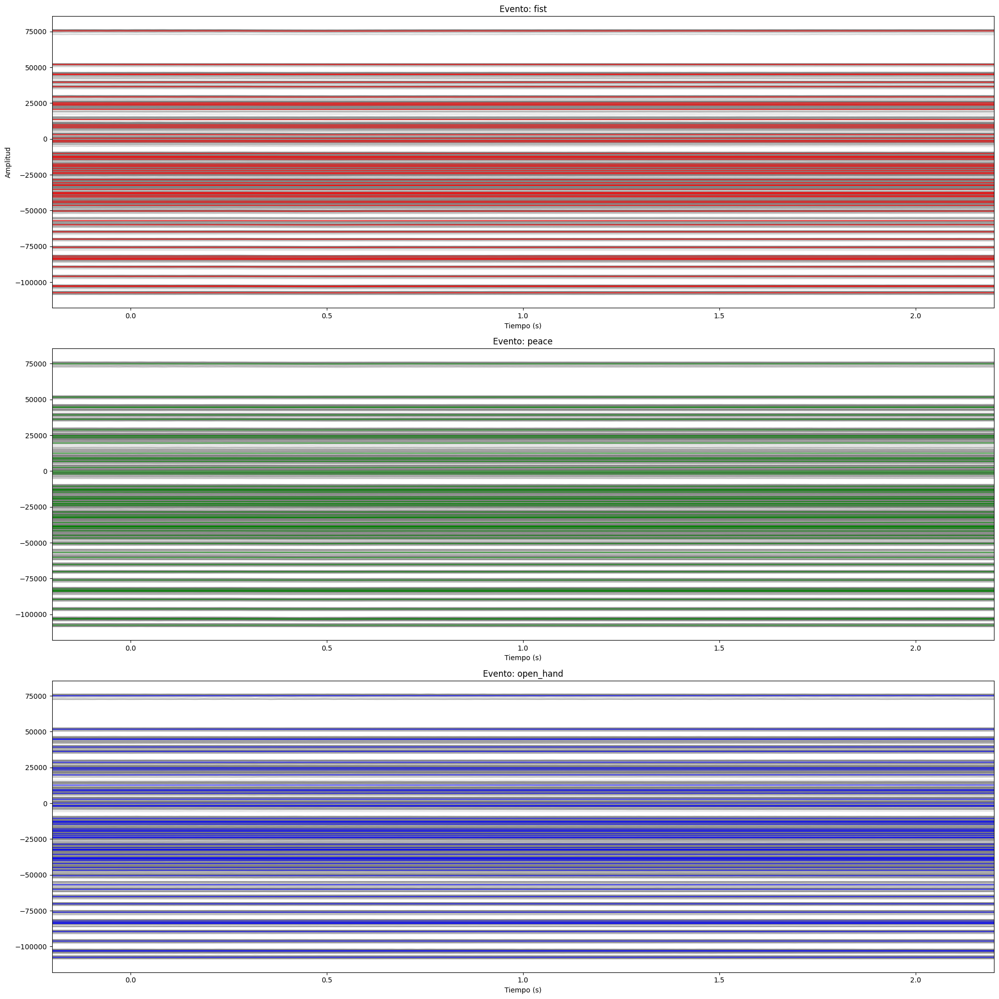

In [23]:
import numpy as np
import matplotlib.pyplot as plt

# --- Parámetros de extracción
pre = 0.2   # segundos antes del evento
post = 2.2  # segundos después del evento (0.2 + 1.8 = 2.0 s totales)
n_channels = 60
samples_pre = int(pre * sfreq)
samples_post = int(post * sfreq)
total_samples = samples_pre + samples_post
event_types = ['fist', 'peace', 'open_hand']
colors = {'fist': 'red', 'peace': 'green', 'open_hand': 'blue'}

# --- Crear figura
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(20, 20), sharey=True)
time_axis = np.linspace(-pre, post, total_samples)

for idx, evt in enumerate(event_types):
    ax = axes[idx]
    event_samples = event_df[event_df['label_name'] == evt]['sample'].values
    segments = []

    for s in event_samples:
        start = s - samples_pre
        end = s + samples_post
        if start < 0 or end > X.shape[0]:
            continue
        segment = X.iloc[start:end, 1:61].values.T  # CH_2 a CH_61
        segments.append(segment)

    segments = np.array(segments)  # shape: (n_events, n_channels, n_samples)

    # --- Plotear cada canal superpuesto (todos los eventos en gris con transparencia)
    for ch in range(n_channels):
        for trial in range(segments.shape[0]):
            ax.plot(time_axis, segments[trial, ch], color='gray', alpha=0.2)

    # --- Promedio por canal
    mean_signal = segments.mean(axis=0)  # shape: (n_channels, n_samples)
    for ch in range(n_channels):
        ax.plot(time_axis, mean_signal[ch], color=colors[evt], alpha=0.7)

    ax.set_title(f"Evento: {evt}")
    ax.set_xlabel("Tiempo (s)")
    ax.set_xlim(time_axis[0],time_axis[-1])
    if idx == 0:
        ax.set_ylabel("Amplitud")

plt.tight_layout()
plt.show()


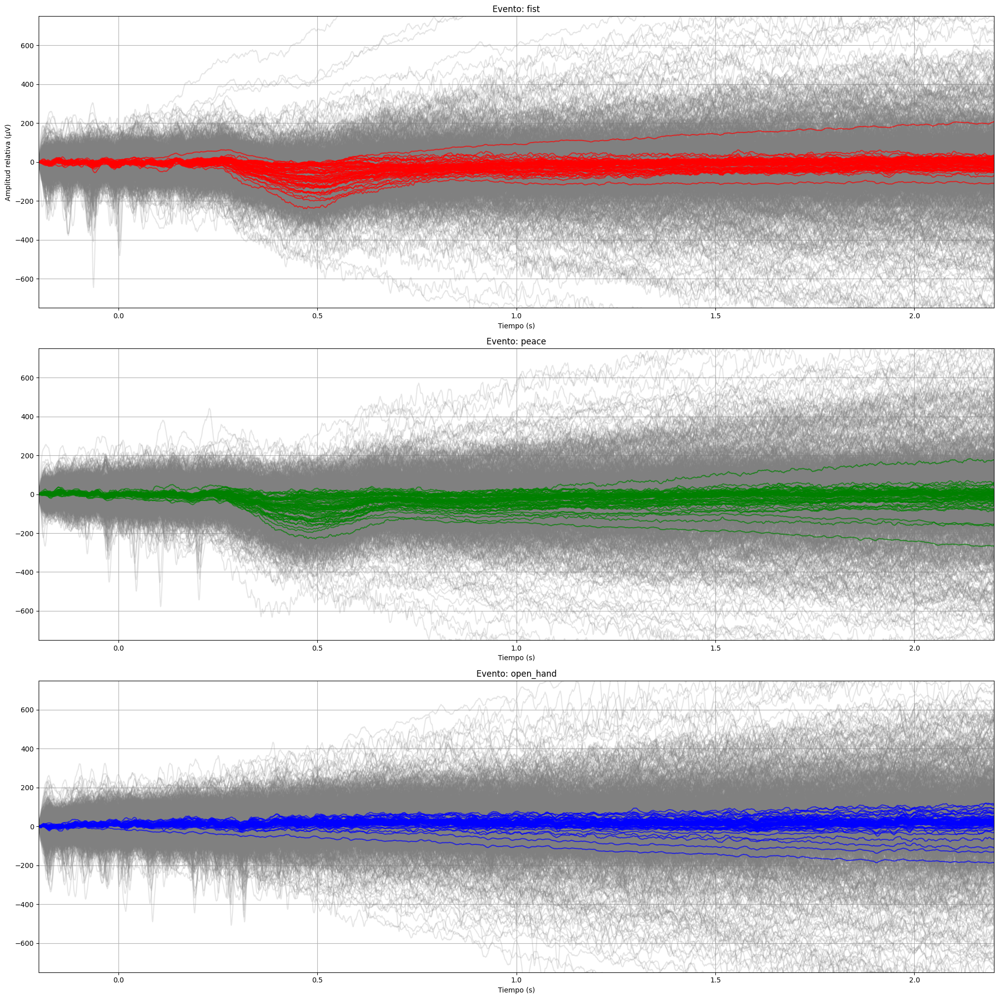

In [24]:
import numpy as np
import matplotlib.pyplot as plt

# --- Parámetros de extracción
pre = 0.2   # segundos antes del evento
post = 2.2  # segundos después del evento
n_channels = 60
samples_pre = int(pre * sfreq)
samples_post = int(post * sfreq)
total_samples = samples_post + samples_pre
event_types = ['fist', 'peace', 'open_hand']
colors = {'fist': 'red', 'peace': 'green', 'open_hand': 'blue'}

# --- Crear figura
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(20, 20), sharey=True)
time_axis = np.linspace(-pre, post, total_samples)

for idx, evt in enumerate(event_types):
    ax = axes[idx]
    event_samples = event_df[event_df['label_name'] == evt]['sample'].values
    segments = []

    for s in event_samples:
        start = s - samples_pre
        end = s + samples_post
        if start < 0 or end > X.shape[0]:
            continue
        segment = X.iloc[start:end, 1:61].values.T  # shape: (60, total_samples)

        # --- Alinear eje Y: restar el valor en t=0 de cada canal
        aligned = segment - segment[:, 0][:, np.newaxis]
        segments.append(aligned)

    segments = np.array(segments)  # shape: (n_events, n_channels, n_samples)

    # --- Señales crudas superpuestas en gris
    for ch in range(n_channels):
        for trial in range(segments.shape[0]):
            ax.plot(time_axis, segments[trial, ch], color='gray', alpha=0.2)

    # --- Promedio de canal en color del evento
    mean_signal = segments.mean(axis=0)  # shape: (n_channels, n_samples)
    for ch in range(n_channels):
        ax.plot(time_axis, mean_signal[ch], color=colors[evt], alpha=0.7)

    ax.set_title(f"Evento: {evt}")
    ax.set_xlabel("Tiempo (s)")
    ax.set_xlim(-pre, post)
    ax.set_ylim(-750, 750)
    ax.grid(linestyle='-')
    if idx == 0:
        ax.set_ylabel("Amplitud relativa (µV)")

plt.tight_layout()
plt.show()


# Four Categories Data

In [25]:
import numpy as np
import pandas as pd

# --- Crear eventos a partir del canal 'paradigm_info'
events = []
last_label = 0
for i, label in enumerate(y):
    if label != last_label and label in [1, 2, 3]:  # ignorar el estado 0 (relax)
        events.append([i, 0, int(label)])
    last_label = label
events = np.array(events)

# --- Crear DataFrame
event_df = pd.DataFrame(events, columns=['sample', 'dummy', 'label'])
event_df['label_name'] = event_df['label'].map({1: 'fist', 2: 'peace', 3: 'open_hand'})
print("Eventos detectados:")
print(event_df.head())

# --- Guardar CSV
event_df.to_csv('ecog_events.csv', index=False)

# --- Crear RawArray para CH_27
sfreq = 1200  # Frecuencia de muestreo

# --- Parámetros
pre = 0.2   # segundos antes del evento
post = 2.2  # segundos después del evento
n_channels = 60
samples_pre = int(pre * sfreq)
samples_post = int(post * sfreq)
total_samples = samples_pre + samples_post
event_types = ['fist', 'peace', 'open_hand']

# --- Detectar segmentos de relax automáticamente
relax_events = []
sorted_samples = np.sort(event_df['sample'].values)

# Buscar espacios grandes entre eventos
for i in range(len(sorted_samples) - 1):
    current = sorted_samples[i]
    next_event = sorted_samples[i + 1]
    gap = next_event - current

    if gap > (samples_pre + samples_post + 300):  # dejar margen extra de 300 muestras
        relax_start = current + (gap // 2)
        relax_events.append(relax_start)

# Crear dataframe de eventos 'relax'
relax_df = pd.DataFrame({
    'sample': relax_events,
    'label_name': ['relax'] * len(relax_events)
})

# Unir al dataframe de eventos original
event_df = pd.concat([event_df, relax_df], ignore_index=True)
event_types.append('relax')

# --- Extraer segmentos
segments_list = []

for evt in event_types:
    event_samples = event_df[event_df['label_name'] == evt]['sample'].values

    for s in event_samples:
        start = s - samples_pre
        end = s + samples_post
        if start < 0 or end > X.shape[0]:
            continue
        segment = X.iloc[start:end, 1:61].values.T  # shape: (60, total_samples)
        aligned = segment - segment[:, 0][:, np.newaxis]  # Y alineado en t = -0.2s

        for ch in range(n_channels):
            row = {
                'label': evt,
                'channel': ch,
                **{f't{i}': aligned[ch, i] for i in range(total_samples)}
            }
            segments_list.append(row)

# Crear DataFrame y guardar
df_segments = pd.DataFrame(segments_list)
df_segments.to_csv('event_segments.csv', index=False)
print("Archivo 'event_segments.csv' guardado con éxito con eventos incluyendo 'relax'.")


Eventos detectados:
   sample  dummy  label label_name
0   14496      0      3  open_hand
1   20256      0      1       fist
2   26112      0      3  open_hand
3   31680      0      2      peace
4   37440      0      2      peace
Archivo 'event_segments.csv' guardado con éxito con eventos incluyendo 'relax'.


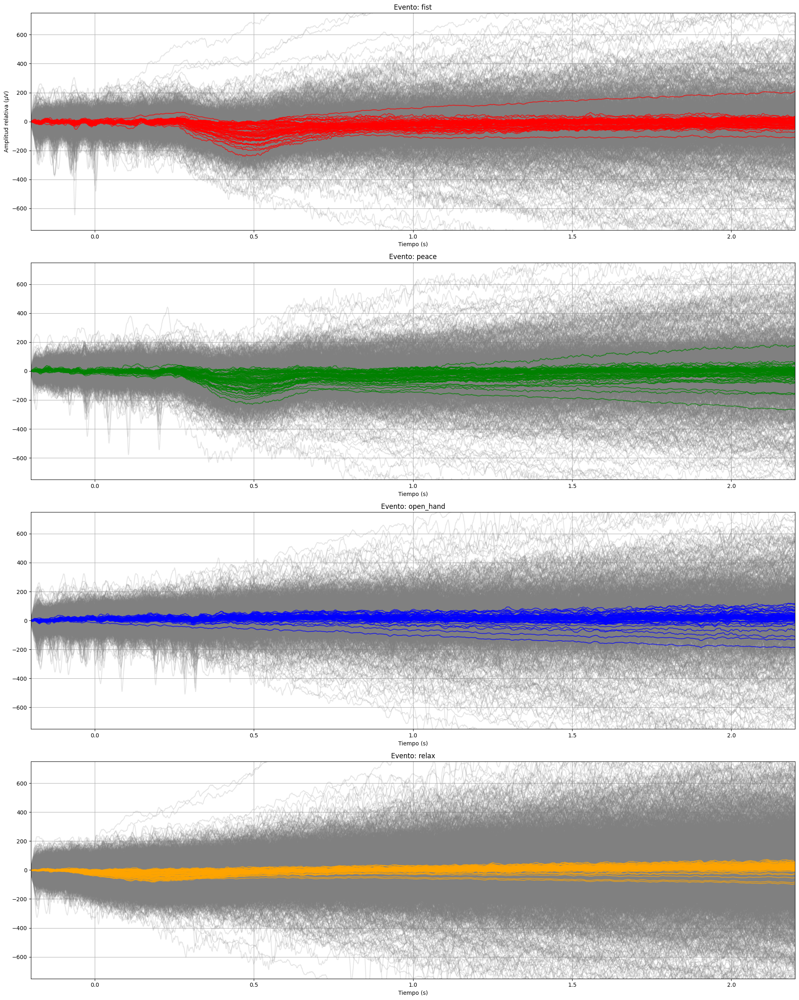

In [26]:
import matplotlib.pyplot as plt

# --- Cargar datos
df_segments = pd.read_csv('event_segments.csv')
event_types = ['fist', 'peace', 'open_hand', 'relax']
colors = {'fist': 'red', 'peace': 'green', 'open_hand': 'blue', 'relax': 'orange'}
time_axis = np.linspace(-pre, post, total_samples)

# --- Crear figura
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(20, 25), sharey=True)

for idx, evt in enumerate(event_types):
    ax = axes[idx]
    df_evt = df_segments[df_segments['label'] == evt]

    segments = []
    for ch in range(n_channels):
        df_ch = df_evt[df_evt['channel'] == ch]
        trials = df_ch.iloc[:, 2:].values  # solo columnas t0..tn
        segments.append(trials)

        for trial in trials:
            ax.plot(time_axis, trial, color='gray', alpha=0.2)

    segments = np.array(segments)  # shape: (n_channels, n_trials, n_samples)
    mean_signal = segments.mean(axis=1)  # shape: (n_channels, n_samples)

    for ch in range(n_channels):
        ax.plot(time_axis, mean_signal[ch], color=colors[evt], alpha=0.7)

    ax.set_title(f"Evento: {evt}")
    ax.set_xlabel("Tiempo (s)")
    ax.set_xlim(-pre, post)
    ax.set_ylim(-750, 750)
    ax.grid(linestyle='-')
    if idx == 0:
        ax.set_ylabel("Amplitud relativa (µV)")

plt.tight_layout()
plt.show()


In [27]:
print("Etiquetas disponibles:", event_df['label_name'].unique())
print("Cantidad de eventos por tipo:\n", event_df['label_name'].value_counts())


Etiquetas disponibles: ['open_hand' 'fist' 'peace' 'relax']
Cantidad de eventos por tipo:
 label_name
relax        89
open_hand    30
fist         30
peace        30
Name: count, dtype: int64


# Clasifiers

In [3]:
# Cargar datos desde CSV y preparar features + etiquetas
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder

# 1. Cargar archivo
df_all = pd.read_csv('event_segments.csv')

# 2. Separar características (X) y etiquetas (y)
X = df_all.drop(columns=['label', 'channel'])  # Ignorar canal
y = df_all['label']

# 3. Estandarizar características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 4. Codificar etiquetas
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# 5. Ver resumen
mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Mapeo de etiquetas:", mapping)
print("X_scaled shape:", X_scaled.shape)
print("y_encoded shape:", y_encoded.shape)

# Mostrar algunas filas
df_scaled = pd.DataFrame(X_scaled, columns=X.columns)
df_scaled['label_encoded'] = y_encoded
df_scaled.head()


Mapeo de etiquetas: {'fist': np.int64(0), 'open_hand': np.int64(1), 'peace': np.int64(2), 'relax': np.int64(3)}
X_scaled shape: (10740, 2880)
y_encoded shape: (10740,)


,t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,...,t2871,t2872,t2873,t2874,t2875,t2876,t2877,t2878,t2879,label_encoded
0,0.0,-0.014456,-0.818519,-0.604286,-1.010885,-0.712850,-0.679787,-0.501597,-0.466561,-0.137681,...,0.256763,0.251056,0.273699,0.302925,0.345184,0.329657,0.302638,0.254241,0.243224,0
1,0.0,0.105068,-0.549110,-0.138691,-0.311641,-0.060596,-0.179519,-0.227484,-0.561899,-0.452612,...,-0.170631,-0.177889,-0.169391,-0.153000,-0.153310,-0.146042,-0.155429,-0.169046,-0.160603,0
2,0.0,0.363449,-0.234637,-0.072473,-0.219463,0.111337,0.013685,-0.040476,-0.215127,-0.060825,...,0.252536,0.242045,0.239034,0.248910,0.249392,0.253031,0.259207,0.249534,0.261225,0
3,0.0,0.627103,-0.361994,-0.029017,-0.303460,-0.037398,-0.164444,-0.110515,-0.346661,-0.159297,...,0.264439,0.261662,0.266247,0.272117,0.278530,0.278350,0.293448,0.294079,0.318671,0
4,0.0,0.211408,-0.143038,-0.093166,-0.278097,0.011043,-0.111680,-0.087050,-0.213996,-0.024798,...,-0.130769,-0.145200,-0.139545,-0.131720,-0.124802,-0.128915,-0.112943,-0.094576,-0.075452,0


In [4]:
# Separar en entrenamiento, validación y prueba
from sklearn.model_selection import train_test_split

# 1. Separar en train+val y test
X_train_val, X_test, y_train_val, y_test = train_test_split(
    X_scaled, y_encoded, test_size=0.10, random_state=42, stratify=y_encoded
)

# 2. Separar train y val
X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val, test_size=0.20, random_state=42, stratify=y_train_val
)

print(f"Tamaños → Train: {X_train.shape[0]}, Val: {X_val.shape[0]}, Test: {X_test.shape[0]}")


Tamaños → Train: 7732, Val: 1934, Test: 1074


In [42]:
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.neural_network import MLPClassifier

# 1) Split train/val/test (igual a tu código):
X_train_val, X_test, y_train_val, y_test = train_test_split(
    X_scaled, y_encoded, test_size=0.10, random_state=42, stratify=y_encoded
)
X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val, test_size=0.20, random_state=42, stratify=y_train_val
)
print(f"Sizes → Train: {X_train.shape[0]}, Val: {X_val.shape[0]}, Test: {X_test.shape[0]}")

# 2) Definimos clasificadores y sus grids
models = {
    "KNN": {
        "model": KNeighborsClassifier(),
        "params": {
            "model__n_neighbors": [3, 5, 7, 9],
            "model__weights": ["uniform", "distance"]
        }
    },
    "Linear SVM": {
        "model": SVC(kernel="linear"),
        "params": {
            "model__C": [0.01, 0.1, 1, 10]
        }
    },
    "RBF SVM": {
        "model": SVC(kernel="rbf"),
        "params": {
            "model__C": [0.1, 1, 10],
            "model__gamma": ["scale", "auto", 0.01, 0.1, 1]
        }
    },
    "Random Forest": {
        "model": RandomForestClassifier(random_state=42),
        "params": {
            "model__n_estimators": [50, 100, 200],
            "model__max_depth": [None, 5, 10],
            "model__max_features": ["sqrt", "log2"]
        }
    },
    "MLP": {
        "model": MLPClassifier(max_iter=1000, random_state=42),
        "params": {
            "model__hidden_layer_sizes": [(100,), (256,128), (512,256,128)],
            "model__alpha": [0.0001, 0.001, 0.01],
            "model__learning_rate": ["constant", "adaptive"]
        }
    },
    "AdaBoost": {
        "model": AdaBoostClassifier(random_state=42),
        "params": {
            "model__n_estimators": [50, 100, 200],
            "model__learning_rate": [0.5, 1.0]
        }
    }
}

results = {}

for name, mp in models.items():
    print(f"\n=== Tuning {name} ===")
    pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("model", mp["model"])
    ])
    grid = GridSearchCV(
        pipe,
        mp["params"],
        cv=5,
        scoring="accuracy",
        n_jobs=-1,
        verbose=1
    )
    # Solo entrenamos sobre train para no “mirar” la val
    grid.fit(X_train, y_train)
    best = grid.best_estimator_
    print(f"--> Best params: {grid.best_params_}")
    # Validación
    y_pred_val = best.predict(X_val)
    print("Val Accuracy:", accuracy_score(y_val, y_pred_val))
    # Evaluación final en test
    y_pred = best.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    print(f"[{name}] Test Accuracy: {acc:.4f}")
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
    print("Classification Report:\n", classification_report(y_test, y_pred))
    results[name] = acc

# 3) Resumen de accuracies
print("\n=== Summary of Test Accuracies ===")
for name, acc in results.items():
    print(f"{name:<15} → {acc:.4f}")




Sizes → Train: 7732, Val: 1934, Test: 1074

=== Tuning KNN ===
Fitting 5 folds for each of 8 candidates, totalling 40 fits
--> Best params: {'model__n_neighbors': 5, 'model__weights': 'distance'}
Val Accuracy: 0.828852119958635
[KNN] Test Accuracy: 0.8119
Confusion Matrix:
 [[134   7  16  23]
 [  3 136   2  39]
 [ 14  11 123  32]
 [ 15  26  14 479]]
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.74      0.77       180
           1       0.76      0.76      0.76       180
           2       0.79      0.68      0.73       180
           3       0.84      0.90      0.87       534

    accuracy                           0.81      1074
   macro avg       0.80      0.77      0.78      1074
weighted avg       0.81      0.81      0.81      1074


=== Tuning Linear SVM ===
Fitting 5 folds for each of 4 candidates, totalling 20 fits
--> Best params: {'model__C': 10}
Val Accuracy: 0.9089968976215098
[Linear SVM] Test Accuracy: 0.9097


In [43]:
import numpy as np
from scipy.stats import loguniform
from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# 1) Reproducir tu split original
X_train_val, X_test, y_train_val, y_test = train_test_split(
    X_scaled, y_encoded,
    test_size=0.10, random_state=42, stratify=y_encoded
)
X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val,
    test_size=0.20, random_state=42, stratify=y_train_val
)
print(f"Sizes → Train: {X_train.shape[0]}, Val: {X_val.shape[0]}, Test: {X_test.shape[0]}")

# 2) Pipeline + RandomizedSearchCV
pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("select", SelectKBest(score_func=f_classif)),   # ANOVA feature selection
    ("svc",    LinearSVC(dual=False, max_iter=5000, random_state=42))
])

param_dist = {
    "select__k":   [50, 100, 200, "all"],
    "svc__C":      loguniform(1e-3, 1e3),
    "svc__tol":    loguniform(1e-4, 1e-1),
    "svc__loss":   ["hinge", "squared_hinge"],
}

search = RandomizedSearchCV(
    estimator       = pipe,
    param_distributions = param_dist,
    n_iter          = 50,
    cv              = StratifiedKFold(5, shuffle=True, random_state=42),
    scoring         = "accuracy",
    n_jobs          = -1,
    random_state    = 42,
    verbose         = 1
)

# 3) Entrenar solo sobre TRAIN (no mira VAL)
search.fit(X_train, y_train)

print("\n🛠  Best hyperparameters:")
print(search.best_params_)

# 4) Validación rápida (opcional)
val_pred = search.best_estimator_.predict(X_val)
print("Val Accuracy:", accuracy_score(y_val, val_pred))

# 5) Evaluación final en TEST
best_svc = search.best_estimator_
y_pred_test = best_svc.predict(X_test)

print(f"\n⭐ Test Accuracy: {accuracy_score(y_test, y_pred_test):.4f}")
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_test))


Sizes → Train: 7732, Val: 1934, Test: 1074
Fitting 5 folds for each of 50 candidates, totalling 250 fits


c:\Users\cesar\anaconda3\envs\pytorch\lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
130 fits failed out of a total of 250.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
130 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\cesar\anaconda3\envs\pytorch\lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\cesar\anaconda3\envs\pytorch\lib\site-packages\sklearn\base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\cesar\anaconda3\envs\pytorch\lib\site-packages\sklearn\pipeline.py", line 662, in fit
    self._final_estimato


🛠  Best hyperparameters:
{'select__k': 'all', 'svc__C': np.float64(1.6015353026206778), 'svc__loss': 'squared_hinge', 'svc__tol': np.float64(0.00046379219034580355)}
Val Accuracy: 0.9529472595656671

⭐ Test Accuracy: 0.9507

Confusion Matrix:
[[173   2   0   5]
 [  1 170   2   7]
 [  3   2 165  10]
 [  7   7   7 513]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       180
           1       0.94      0.94      0.94       180
           2       0.95      0.92      0.93       180
           3       0.96      0.96      0.96       534

    accuracy                           0.95      1074
   macro avg       0.95      0.95      0.95      1074
weighted avg       0.95      0.95      0.95      1074



In [ ]:
import numpy as np
from scipy.stats import loguniform
from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC, LinearSVC
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# 1) Reproducir tu split original
X_train_val, X_test, y_train_val, y_test = train_test_split(
    X_scaled, y_encoded,
    test_size=0.10, random_state=42, stratify=y_encoded
)
X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val,
    test_size=0.20, random_state=42, stratify=y_train_val
)

# 2) Función de búsqueda de hiperparámetros
def tune_model(pipe, param_dist, X_tr, y_tr):
    search = RandomizedSearchCV(
        estimator=pipe,
        param_distributions=param_dist,
        n_iter=30,
        cv=StratifiedKFold(5, shuffle=True, random_state=42),
        scoring="accuracy",
        n_jobs=-1,
        random_state=42,
        verbose=0
    )
    search.fit(X_tr, y_tr)
    return search

# --- a) RBF SVM ---
pipe_rbf = Pipeline([
    ("scaler", StandardScaler()),
    ("select", SelectKBest(f_classif)),
    ("svc",    SVC(kernel="rbf", probability=True, random_state=42))
])
param_rbf = {
    "select__k":   [50, 100, 200, "all"],
    "svc__C":      loguniform(1e-2, 1e2),
    "svc__gamma":  loguniform(1e-4, 1e-1),
}
search_rbf = tune_model(pipe_rbf, param_rbf, X_train, y_train)
print("🛠 RBF SVM best params:", search_rbf.best_params_)
print("Val Acc RBF SVM:", accuracy_score(y_val, search_rbf.predict(X_val)))

y_pred_rbf = search_rbf.best_estimator_.predict(X_test)
print(f"\n[RBF SVM] ⭐ Test Accuracy: {accuracy_score(y_test, y_pred_rbf):.4f}")
print("[RBF SVM] Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_rbf))
print("[RBF SVM] Classification Report:")
print(classification_report(y_test, y_pred_rbf))

# --- b) MLP ---
pipe_mlp = Pipeline([
    ("scaler", StandardScaler()),
    ("select", SelectKBest(f_classif)),
    ("mlp",    MLPClassifier(max_iter=2000, random_state=42))
])
param_mlp = {
    "select__k":               [50, 100, 200, "all"],
    "mlp__hidden_layer_sizes": [(100,), (256, 128), (512, 256, 128)],
    "mlp__alpha":              loguniform(1e-5, 1e-1),
    "mlp__learning_rate_init": loguniform(1e-4, 1e-1),
}
search_mlp = tune_model(pipe_mlp, param_mlp, X_train, y_train)
print("\n🛠 MLP best params:", search_mlp.best_params_)
print("Val Acc MLP:", accuracy_score(y_val, search_mlp.predict(X_val)))

y_pred_mlp = search_mlp.best_estimator_.predict(X_test)
print(f"\n[MLP] ⭐ Test Accuracy: {accuracy_score(y_test, y_pred_mlp):.4f}")
print("[MLP] Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_mlp))
print("[MLP] Classification Report:")
print(classification_report(y_test, y_pred_mlp))

# --- c) Linear SVC ---
pipe_lin = Pipeline([
    ("scaler", StandardScaler()),
    ("select", SelectKBest(f_classif)),
    ("svc",    LinearSVC(dual=False, max_iter=5000, random_state=42))
])
param_lin = {
    "select__k": [50, 100, 200, "all"],
    "svc__C":    loguniform(1e-3, 1e3),
    "svc__tol":  loguniform(1e-4, 1e-1),
    "svc__loss": ["hinge", "squared_hinge"],
}
search_lin = tune_model(pipe_lin, param_lin, X_train, y_train)
print("\n🛠 Linear SVC best params:", search_lin.best_params_)
print("Val Acc Linear SVC:", accuracy_score(y_val, search_lin.predict(X_val)))

y_pred_lin = search_lin.best_estimator_.predict(X_test)
print(f"\n[Linear SVC] ⭐ Test Accuracy: {accuracy_score(y_test, y_pred_lin):.4f}")
print("[Linear SVC] Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_lin))
print("[Linear SVC] Classification Report:")
print(classification_report(y_test, y_pred_lin))




c:\Users\cesar\anaconda3\envs\pytorch\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
c:\Users\cesar\anaconda3\envs\pytorch\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


🛠 RBF SVM best params: {'select__k': 'all', 'svc__C': np.float64(10.506199451597043), 'svc__gamma': np.float64(0.0018856783874794994)}
Val Acc RBF SVM: 0.8795243019648397

[RBF SVM] ⭐ Test Accuracy: 0.8734
[RBF SVM] Confusion Matrix:
[[143   6   8  23]
 [  1 135   0  44]
 [  7   3 140  30]
 [  4   4   6 520]]
[RBF SVM] Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.79      0.85       180
           1       0.91      0.75      0.82       180
           2       0.91      0.78      0.84       180
           3       0.84      0.97      0.90       534

    accuracy                           0.87      1074
   macro avg       0.90      0.82      0.85      1074
weighted avg       0.88      0.87      0.87      1074



c:\Users\cesar\anaconda3\envs\pytorch\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
c:\Users\cesar\anaconda3\envs\pytorch\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw



🛠 MLP best params: {'mlp__alpha': np.float64(0.000348069532678527), 'mlp__hidden_layer_sizes': (256, 128), 'mlp__learning_rate_init': np.float64(0.00019634341572933326), 'select__k': 'all'}
Val Acc MLP: 0.9157187176835574

[MLP] ⭐ Test Accuracy: 0.9153
[MLP] Confusion Matrix:
[[163   2   6   9]
 [  0 157   4  19]
 [  6   4 147  23]
 [  4   7   7 516]]
[MLP] Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.91      0.92       180
           1       0.92      0.87      0.90       180
           2       0.90      0.82      0.85       180
           3       0.91      0.97      0.94       534

    accuracy                           0.92      1074
   macro avg       0.92      0.89      0.90      1074
weighted avg       0.92      0.92      0.91      1074



c:\Users\cesar\anaconda3\envs\pytorch\lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
85 fits failed out of a total of 150.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
85 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\cesar\anaconda3\envs\pytorch\lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\cesar\anaconda3\envs\pytorch\lib\site-packages\sklearn\base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\cesar\anaconda3\envs\pytorch\lib\site-packages\sklearn\pipeline.py", line 662, in fit
    self._final_estimator.


🛠 Linear SVC best params: {'select__k': 'all', 'svc__C': np.float64(427.87435167598187), 'svc__loss': 'squared_hinge', 'svc__tol': np.float64(0.0003511356313970409)}
Val Acc Linear SVC: 0.9472595656670114

[Linear SVC] ⭐ Test Accuracy: 0.9469
[Linear SVC] Confusion Matrix:
[[173   2   1   4]
 [  1 171   2   6]
 [  4   2 164  10]
 [  8   8   9 509]]
[Linear SVC] Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.96      0.95       180
           1       0.93      0.95      0.94       180
           2       0.93      0.91      0.92       180
           3       0.96      0.95      0.96       534

    accuracy                           0.95      1074
   macro avg       0.94      0.94      0.94      1074
weighted avg       0.95      0.95      0.95      1074



TypeError: __init__() got an unexpected keyword argument 'pasthrough'

In [47]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# 3) Stacking de los tres mejores
estimators = [
    ('lin_svc', search.best_estimator_),
    ('rbf_svc', search_rbf.best_estimator_),
    ('mlp',     search_mlp.best_estimator_),
]
stack = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(),
    cv=5,
    passthrough=False,   # <- aquí estaba el typo
    n_jobs=-1
)
stack.fit(X_train, y_train)
y_pred_stack = stack.predict(X_test)

print(f"\n[STACK] ⭐ Test Accuracy: {accuracy_score(y_test, y_pred_stack):.4f}")
print("[STACK] Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_stack))
print("[STACK] Classification Report:")
print(classification_report(y_test, y_pred_stack))



[STACK] ⭐ Test Accuracy: 0.9683
[STACK] Confusion Matrix:
[[176   2   0   2]
 [  0 173   1   6]
 [  1   3 166  10]
 [  3   2   4 525]]
[STACK] Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       180
           1       0.96      0.96      0.96       180
           2       0.97      0.92      0.95       180
           3       0.97      0.98      0.97       534

    accuracy                           0.97      1074
   macro avg       0.97      0.96      0.96      1074
weighted avg       0.97      0.97      0.97      1074



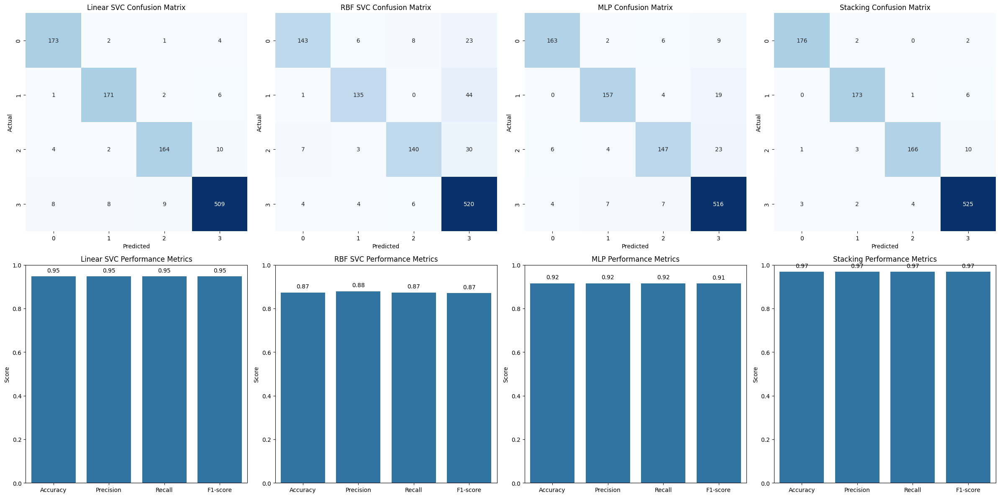


=== Linear SVC Classification Report ===
              precision    recall  f1-score   support

           0       0.93      0.96      0.95       180
           1       0.93      0.95      0.94       180
           2       0.93      0.91      0.92       180
           3       0.96      0.95      0.96       534

    accuracy                           0.95      1074
   macro avg       0.94      0.94      0.94      1074
weighted avg       0.95      0.95      0.95      1074


=== RBF SVC Classification Report ===
              precision    recall  f1-score   support

           0       0.92      0.79      0.85       180
           1       0.91      0.75      0.82       180
           2       0.91      0.78      0.84       180
           3       0.84      0.97      0.90       534

    accuracy                           0.87      1074
   macro avg       0.90      0.82      0.85      1074
weighted avg       0.88      0.87      0.87      1074


=== MLP Classification Report ===
              

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score

# 1) Gather predictions and true labels
y_true = y_test
model_preds = {
    'Linear SVC':     y_pred_lin,
    'RBF SVC':        y_pred_rbf,
    'MLP':            y_pred_mlp,
    'Stacking':       y_pred_stack
}

# 2) Compute metrics and confusion matrices
metrics = {}
cms = {}
for name, y_pred in model_preds.items():
    acc  = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    rec  = recall_score(y_true, y_pred, average='weighted')
    f1   = f1_score(y_true, y_pred, average='weighted')
    metrics[name] = {'Accuracy': acc, 'Precision': prec, 'Recall': rec, 'F1-score': f1}
    cms[name] = confusion_matrix(y_true, y_pred)

# 3) Set up figure with 2 rows x 4 columns
fig, axes = plt.subplots(2, 4, figsize=(24, 12))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

# 4) Plot confusion matrices (top row)
for idx, (name, cm) in enumerate(cms.items()):
    ax = axes[0, idx]
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax, cbar=False)
    ax.set_title(f"{name} Confusion Matrix")
    ax.set_xlabel("Predicted")
    ax.set_ylabel("Actual")

# 5) Plot bar charts of metrics (bottom row)
for idx, (name, m) in enumerate(metrics.items()):
    ax = axes[1, idx]
    metric_names = list(m.keys())
    metric_values = list(m.values())
    sns.barplot(x=metric_names, y=metric_values, ax=ax)
    ax.set_ylim(0, 1.0)
    ax.set_title(f"{name} Performance Metrics")
    for i, v in enumerate(metric_values):
        ax.text(i, v + 0.02, f"{v:.2f}", ha='center')
    ax.set_ylabel("Score")

plt.tight_layout()
plt.show()

# 6) Print detailed classification reports
for name, y_pred in model_preds.items():
    print(f"\n=== {name} Classification Report ===")
    print(classification_report(y_true, y_pred, zero_division=0))


# SSD Spatial Filters Example

In [ ]:
# %%
# Import core libraries
import numpy as np
import matplotlib.pyplot as plt
import mne
from mne.decoding import SSD
from scipy.io import loadmat
import gc


In [ ]:
# Define channel names and types
col_names = [f'CH_{i}' for i in range(2, 62)]
col_names.extend(['paradigm_info'])

sampling_freq = 1200
ch_types = ['misc'] + ['ecog'] * 60 + ['stim']
info = mne.create_info(ch_names=["time"] + col_names, ch_types=ch_types, sfreq=sampling_freq)


In [ ]:
# Load the .mat file (update path if needed)
data = loadmat("/content/ECoG_Handpose.mat")['y']  # <-- Replace with actual upload path if needed

# Create raw object (drop time channel for data)
raw = mne.io.RawArray(data[0:62, :], info)

# Extract timing and paradigm information
timings = data[0, :]
paradigm_info = data[61, :]     # Stimulus info
finger_movement_onsets = data[62:, :]  # Glove data (not used directly here)
assert finger_movement_onsets.shape[0] == 5


Creating RawArray with float64 data, n_channels=62, n_times=507025
    Range : 0 ... 507024 =      0.000 ...   422.520 secs
Ready.


In [ ]:
# Resample data and extract events
gc.collect()
raw.load_data().resample(600)
events = mne.find_events(raw, stim_channel="paradigm_info")

# Define movement classes
event_id = dict(fist_movement=1, peace_movement=2, open_hand=3)

# Create epochs centered around events
epochs = mne.Epochs(raw, events, tmin=-0.75, tmax=0.75, event_id=event_id,
                    preload=True, baseline=None)

# Clean up
del data
gc.collect()


90 events found on stim channel paradigm_info
Event IDs: [1 2 3]
90 events found on stim channel paradigm_info
Event IDs: [1 2 3]
90 events found on stim channel paradigm_info
Event IDs: [1 2 3]
Not setting metadata
90 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 90 events and 901 original time points ...
0 bad epochs dropped


75

In [ ]:
# Resample and filter raw again to target frequencies
raw.resample(sfreq=250)
raw.pick_types(ecog=True, eeg=False, ref_meg=False)

# Define frequency bands for signal and noise
freqs_sig = (9, 12)
freqs_noise = (8, 13)

# Instantiate and fit SSD
ssd = SSD(info=raw.info,
          reg='oas',
          sort_by_spectral_ratio=False,
          filt_params_signal=dict(l_freq=freqs_sig[0], h_freq=freqs_sig[1],
                                  l_trans_bandwidth=1, h_trans_bandwidth=1),
          filt_params_noise=dict(l_freq=freqs_noise[0], h_freq=freqs_noise[1],
                                 l_trans_bandwidth=1, h_trans_bandwidth=1))
ssd.fit(X=raw.get_data())


90 events found on stim channel paradigm_info
Event IDs: [1 2 3]
90 events found on stim channel paradigm_info
Event IDs: [1 2 3]
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up band-pass filter from 9 - 12 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 9.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 8.50 Hz)
- Upper passband edge: 12.00 Hz
- Upper transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 12.50 Hz)
- Filter length: 825 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 7.50 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 13.50 Hz)
- Filter length: 825 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Estimating covariance using OAS
Done.
Estimating covariance using OAS
Done.
Computing rank from covariance with rank=None
    Using tolerance 0.69 (2.2e-16 eps * 60 dim * 5.2e+13  max singular value)
    Estimated rank (ecog): 60
    ECOG: rank 60 computed from 60 data channels with 0 projectors
Computing rank from covariance with rank=None
    Using tolerance 0.39 (2.2e-16 eps * 60 dim * 2.9e+13  max singular value)
    Estimated rank (ecog): 60
    ECOG: rank 60 computed from 60 data channels with 0 projectors
Preserving covariance rank (60)
Done.


SSD(filt_params_noise={'h_freq': 13, 'h_trans_bandwidth': 1, 'l_freq': 8,
                       'l_trans_bandwidth': 1},
    filt_params_signal={'h_freq': 12, 'h_trans_bandwidth': 1, 'l_freq': 9,
                        'l_trans_bandwidth': 1},
    info=<Info | 7 non-empty values
 bads: []
 ch_names: CH_2, CH_3, CH_4, CH_5, CH_6, CH_7, CH_8, CH_9, CH_10, CH_11, ...
 chs: 60 ECoG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 125.0 Hz
 meas_date: unspecified
 nchan: 60
 projs: []
 sfreq: 250.0 Hz
>,
    n_fft=250, reg='oas', sort_by_spectral_ratio=False)

In [ ]:
# Create EvokedArray for topographical visualization
pattern = mne.EvokedArray(data=ssd.patterns_[:4].T, info=ssd.info)
pattern.plot_topomap(units=dict(mag='A.U.'), time_format='')  # Uncomment to plot topomap


TypeError: plot_topomap() got an unexpected keyword argument 'show_names'

Effective window size : 16.384 (s)
Effective window size : 1.000 (s)


Text(0.5, 1.0, 'Spectral Ratio of SSD Components')

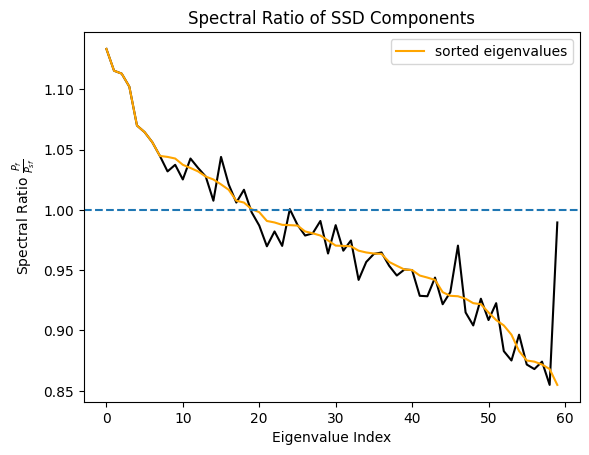

In [ ]:
# Apply SSD to raw data
ssd_sources = ssd.transform(X=raw.get_data())

# Compute power spectral density (PSD)
psd, freqs = mne.time_frequency.psd_array_welch(ssd_sources, sfreq=raw.info['sfreq'], n_fft=4096)

# Get spectral ratios and sort
spec_ratio, sorter = ssd.get_spectral_ratio(ssd_sources)

# Plot spectral ratio
fig, ax = plt.subplots(1)
ax.plot(spec_ratio, color='black')
ax.plot(spec_ratio[sorter], color='orange', label='sorted eigenvalues')
ax.set_xlabel("Eigenvalue Index")
ax.set_ylabel(r"Spectral Ratio $\frac{P_f}{P_{sf}}$")
ax.axhline(1, linestyle='--')
ax.legend()
plt.title("Spectral Ratio of SSD Components")


Text(0.5, 1.0, 'Power Spectrum of SSD Components')

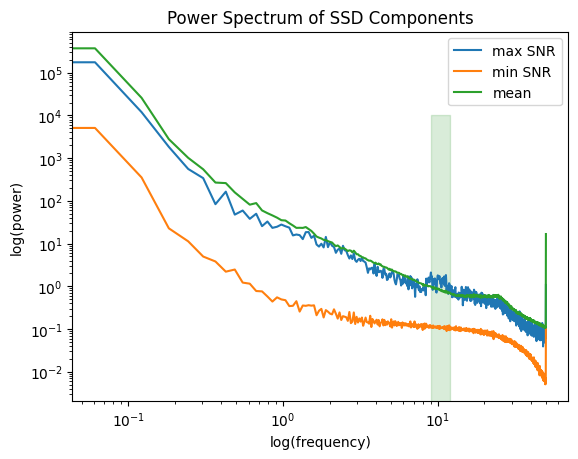

In [ ]:
# Plot PSD for max SNR and min SNR components
below50 = freqs < 50
bandfilt = (freqs_sig[0] <= freqs) & (freqs <= freqs_sig[1])

fig, ax = plt.subplots(1)
ax.loglog(freqs[below50], psd[0, below50], label='max SNR')
ax.loglog(freqs[below50], psd[-1, below50], label='min SNR')
ax.loglog(freqs[below50], psd[:, below50].mean(axis=0), label='mean')
ax.fill_between(freqs[bandfilt], 0, 10000, color='green', alpha=0.15)
ax.set_xlabel('log(frequency)')
ax.set_ylabel('log(power)')
ax.legend()
plt.title("Power Spectrum of SSD Components")


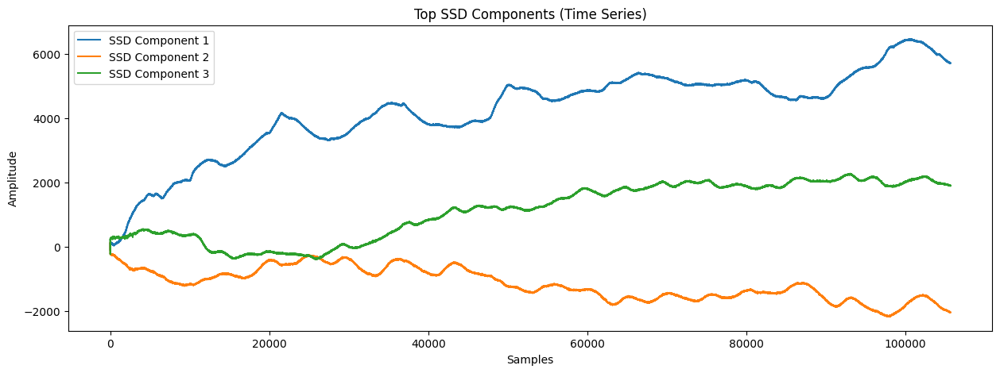

In [ ]:
plt.figure(figsize=(15, 5))
for i in range(3):
    plt.plot(ssd_sources[i, :], label=f'SSD Component {i+1}')
plt.title('Top SSD Components (Time Series)')
plt.xlabel('Samples')
plt.ylabel('Amplitude')
plt.legend()
plt.show()


# ML


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Creamos epochs para extraer datos por evento
X_epochs = epochs.get_data()  # shape: (n_epochs, n_channels, n_times)
y_epochs = epochs.events[:, 2]  # clases: 1=fist, 2=peace, 3=open hand

# Usamos solo los primeros 5 componentes SSD
X_ssd = ssd.transform(X_epochs[:, :, :])[:, :5, :]  # (n_epochs, n_components, n_times)

# Extraemos media de energía por componente
X_feats = np.mean(X_ssd ** 2, axis=2)

# Clasificador
X_train, X_test, y_train, y_test = train_test_split(X_feats, y_epochs, test_size=0.2, random_state=42)
clf = RandomForestClassifier(n_estimators=100)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

print(classification_report(y_test, y_pred))


ValueError: Info must match the input data.Found 62 channels but expected 60.

In [7]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader

# Use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# === 1. Prepare data loaders (tensors en CPU) ===
X_train_t = torch.from_numpy(X_train).float()    # NO .to(device)
y_train_t = torch.from_numpy(y_train).long()
X_val_t   = torch.from_numpy(X_val).float()
y_val_t   = torch.from_numpy(y_val).long()
X_test_t  = torch.from_numpy(X_test).float()
y_test_t  = torch.from_numpy(y_test).long()

train_ds = TensorDataset(X_train_t, y_train_t)
val_ds   = TensorDataset(X_val_t,   y_val_t)
test_ds  = TensorDataset(X_test_t,  y_test_t)

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True,  num_workers=0)
val_loader   = DataLoader(val_ds,   batch_size=64, shuffle=False, num_workers=0)
test_loader  = DataLoader(test_ds,  batch_size=64, shuffle=False, num_workers=0)

# === 2. En tu función train_epoch y eval_model, mueve a GPU por batch ===
def train_epoch(model, loader, optimizer, criterion):
    model.train()
    total_loss = 0
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)      # aquí pasas a GPU
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * xb.size(0)
    return total_loss / len(loader.dataset)

def eval_model(model, loader):
    model.eval()
    correct = 0
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)  # también aquí
            preds = model(xb)
            _, pred_labels = preds.max(1)
            correct += (pred_labels == yb).sum().item()
    return correct / len(loader.dataset)

# === 2. MLP classifier ===
class MLPClassifier(nn.Module):
    def __init__(self, input_dim, num_classes=4):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(256, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(128, num_classes)
        )
    def forward(self, x):
        return self.net(x)

# Instantiate model, loss, optimizer
input_dim = X_train.shape[1]
mlp = MLPClassifier(input_dim).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(mlp.parameters(), lr=1e-3)


# Run training
patience = 5            # si 5 épocas seguidas no mejora la val_acc, paramos
best_val_acc = 0.0
epochs_no_improve = 0

for epoch in range(1, 51):
    train_loss = train_epoch(mlp, train_loader, optimizer, criterion)
    val_acc    = eval_model(mlp, val_loader)
    print(f"[MLP] Epoch {epoch:02d} – Train Loss: {train_loss:.4f}, Val Acc: {val_acc:.4f}")

    # Comprueba mejora
    if val_acc > best_val_acc + 1e-4:  
        best_val_acc    = val_acc
        epochs_no_improve = 0
        torch.save(mlp.state_dict(), "best_mlp.pt")
    else:
        epochs_no_improve += 1

    # Early stopping
    if epochs_no_improve >= patience:
        print(f"No improvement for {patience} epochs, stopping early at epoch {epoch}.")
        break

# Cargar el mejor modelo y evaluar en test
mlp.load_state_dict(torch.load("best_mlp.pt"))
test_acc = eval_model(mlp, test_loader)
print(f"[MLP] Test Accuracy: {test_acc:.4f}")


# === 3. 1D-CNN classifier on feature vector ===
# Here we treat the 180-dim feature vector as a “sequence” of length 180 with 1 channel.
class CNN1DClassifier(nn.Module):
    def __init__(self, seq_len, num_classes=4):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv1d(1, 32, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool1d(2),
            nn.Conv1d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool1d(2),
        )
        # compute flattened size after pooling
        pooled_len = seq_len // 4
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * pooled_len, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(128, num_classes)
        )
    def forward(self, x):
        # x shape: (batch, features)
        x = x.unsqueeze(1)               # (batch, 1, features)
        x = self.encoder(x)              # (batch, 64, features/4)
        return self.classifier(x)

# Instantiate, loss, optimizer
cnn = CNN1DClassifier(seq_len=input_dim).to(device)
optimizer_c = optim.Adam(cnn.parameters(), lr=1e-3)

# Training loop is same as above, just swap model & optimizer
best_val_acc = 0
for epoch in range(1, 51):
    train_loss = train_epoch(cnn, train_loader, optimizer_c, criterion)
    val_acc = eval_model(cnn, val_loader)
    print(f"[1D-CNN] Epoch {epoch:02d} – Train Loss: {train_loss:.4f}, Val Acc: {val_acc:.4f}")
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(cnn.state_dict(), "best_cnn1d.pt")

cnn.load_state_dict(torch.load("best_cnn1d.pt"))
test_acc = eval_model(cnn, test_loader)
print(f"[1D-CNN] Test Accuracy: {test_acc:.4f}")


Using device: cuda
[MLP] Epoch 01 – Train Loss: 1.2673, Val Acc: 0.6055
[MLP] Epoch 02 – Train Loss: 1.0363, Val Acc: 0.5988
[MLP] Epoch 03 – Train Loss: 0.9848, Val Acc: 0.6096
[MLP] Epoch 04 – Train Loss: 0.9165, Val Acc: 0.6618
[MLP] Epoch 05 – Train Loss: 0.9000, Val Acc: 0.6820
[MLP] Epoch 06 – Train Loss: 0.8668, Val Acc: 0.6686
[MLP] Epoch 07 – Train Loss: 0.8624, Val Acc: 0.7017
[MLP] Epoch 08 – Train Loss: 0.8289, Val Acc: 0.7032
[MLP] Epoch 09 – Train Loss: 0.7909, Val Acc: 0.7203
[MLP] Epoch 10 – Train Loss: 0.7787, Val Acc: 0.7192
[MLP] Epoch 11 – Train Loss: 0.7652, Val Acc: 0.7265
[MLP] Epoch 12 – Train Loss: 0.7437, Val Acc: 0.7353
[MLP] Epoch 13 – Train Loss: 0.7199, Val Acc: 0.7606
[MLP] Epoch 14 – Train Loss: 0.7179, Val Acc: 0.7291
[MLP] Epoch 15 – Train Loss: 0.7016, Val Acc: 0.7477
[MLP] Epoch 16 – Train Loss: 0.6828, Val Acc: 0.7327
[MLP] Epoch 17 – Train Loss: 0.6621, Val Acc: 0.7720
[MLP] Epoch 18 – Train Loss: 0.6709, Val Acc: 0.7720
[MLP] Epoch 19 – Train Loss

In [22]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader

# ================================
# 0. Device and DataLoader Setup
# ================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Preparamos tensores en CPU y moveremos a GPU por batch
X_train_t = torch.from_numpy(X_train).float()
y_train_t = torch.from_numpy(y_train).long()
X_val_t   = torch.from_numpy(X_val).float()
y_val_t   = torch.from_numpy(y_val).long()
X_test_t  = torch.from_numpy(X_test).float()
y_test_t  = torch.from_numpy(y_test).long()

train_loader = DataLoader(TensorDataset(X_train_t, y_train_t),
                          batch_size=32, shuffle=True,  num_workers=0)
val_loader   = DataLoader(TensorDataset(X_val_t,   y_val_t),
                          batch_size=64, shuffle=False, num_workers=0)
test_loader  = DataLoader(TensorDataset(X_test_t,  y_test_t),
                          batch_size=64, shuffle=False, num_workers=0)

input_dim   = X_train.shape[1]
num_classes = int(torch.unique(y_train_t).numel())

# ====================================
# 1. Training / Evaluation Functions
# ====================================
def train_epoch(model, loader, optimizer, criterion):
    model.train()
    total_loss = 0.0
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss  = criterion(preds, yb)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * xb.size(0)
    return total_loss / len(loader.dataset)

def eval_model(model, loader):
    model.eval()
    correct = 0
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            _, pl = preds.max(1)
            correct += (pl == yb).sum().item()
    return correct / len(loader.dataset)

criterion = nn.CrossEntropyLoss()

# ============
# 2. MLP
# ============
class MLPClassifier(nn.Module):
    def __init__(self, dim, C):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(dim, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(256, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(128, C)
        )
    def forward(self, x):
        return self.net(x)

mlp     = MLPClassifier(input_dim, num_classes).to(device)
opt_mlp = optim.Adam(mlp.parameters(), lr=1e-3)

best_val_acc = 0.0
EPOCHS = 50
for epoch in range(1, EPOCHS+1):
    loss    = train_epoch(mlp, train_loader, opt_mlp, criterion)
    val_acc = eval_model(mlp, val_loader)
    print(f"[MLP] Epoch {epoch:02d}/{EPOCHS} – Loss: {loss:.4f}, Val Acc: {val_acc:.4f}")
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(mlp.state_dict(), "best_mlp.pt")

mlp.load_state_dict(torch.load("best_mlp.pt"))
print(f"[MLP] Test Acc: {eval_model(mlp, test_loader):.4f}\n")

# ================
# 3. 1D-CNN
# ================
class CNN1DClassifier(nn.Module):
    def __init__(self, L, C):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv1d(1, 32, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool1d(2),
            nn.Conv1d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool1d(2),
        )
        pooled_len = L // 4
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * pooled_len, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(128, C)
        )
    def forward(self, x):
        x = x.unsqueeze(1)  # (batch,1,features)
        x = self.encoder(x)
        return self.classifier(x)

cnn1d   = CNN1DClassifier(input_dim, num_classes).to(device)
opt_cnn = optim.Adam(cnn1d.parameters(), lr=1e-3)

best_val_acc = 0.0
for epoch in range(1, EPOCHS+1):
    loss    = train_epoch(cnn1d, train_loader, opt_cnn, criterion)
    val_acc = eval_model(cnn1d, val_loader)
    print(f"[1D-CNN] Epoch {epoch:02d}/{EPOCHS} – Loss: {loss:.4f}, Val Acc: {val_acc:.4f}")
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(cnn1d.state_dict(), "best_cnn1d.pt")

cnn1d.load_state_dict(torch.load("best_cnn1d.pt"))
print(f"[1D-CNN] Test Acc: {eval_model(cnn1d, test_loader):.4f}\n")

# ============
# 4. LSTM
# ============
class LSTMClassifier(nn.Module):
    def __init__(self, L, C, hidden=64):
        super().__init__()
        self.lstm = nn.LSTM(input_size=1, hidden_size=hidden,
                            num_layers=1, batch_first=True,
                            bidirectional=True)
        self.fc   = nn.Sequential(
            nn.Linear(hidden*2, 64),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(64, C)
        )
    def forward(self, x):
        x = x.unsqueeze(-1)       # (batch,features,1)
        out,_ = self.lstm(x)      # (batch,features,hidden*2)
        feat  = out.mean(dim=1)   # global average
        return self.fc(feat)

lstm     = LSTMClassifier(input_dim, num_classes).to(device)
opt_lstm = optim.Adam(lstm.parameters(), lr=1e-3)

best_val_acc = 0.0
for epoch in range(1, EPOCHS+1):
    loss    = train_epoch(lstm, train_loader, opt_lstm, criterion)
    val_acc = eval_model(lstm, val_loader)
    print(f"[LSTM] Epoch {epoch:02d}/{EPOCHS} – Loss: {loss:.4f}, Val Acc: {val_acc:.4f}")
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(lstm.state_dict(), "best_lstm.pt")

lstm.load_state_dict(torch.load("best_lstm.pt"))
print(f"[LSTM] Test Acc: {eval_model(lstm, test_loader):.4f}\n")

# ======================================
# 5. Fast Transformer (no early stop)
# ======================================
class FastTransformerClassifier(nn.Module):
    def __init__(self, L, d_model, nhead, nlayers, C):
        super().__init__()
        self.embed     = nn.Linear(1, d_model)
        self.pos_embed = nn.Parameter(torch.randn(1, L, d_model))
        layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=nhead,
            dim_feedforward=d_model*2,
            dropout=0.1, activation='relu',
            batch_first=True
        )
        self.transform = nn.TransformerEncoder(layer, num_layers=nlayers)
        self.fc        = nn.Sequential(
            nn.Linear(d_model, 64),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
            nn.Linear(64, C)
        )
    def forward(self, x):
        x = x.unsqueeze(-1)             # (batch,seq_len,1)
        x = self.embed(x) + self.pos_embed
        x = self.transform(x)           # (batch,seq_len,d_model)
        feat = x.mean(dim=1)            # global average
        return self.fc(feat)

transf    = FastTransformerClassifier(
    L=input_dim, d_model=32, nhead=2, nlayers=1, C=num_classes
).to(device)
opt_trans = optim.Adam(transf.parameters(), lr=5e-4)

best_val_acc = 0.0
for epoch in range(1, 21):  # 20 epochs fijos
    loss    = train_epoch(transf, train_loader, opt_trans, criterion)
    val_acc = eval_model(transf, val_loader)
    print(f"[Transformer] Epoch {epoch:02d}/20 – Loss: {loss:.4f}, Val Acc: {val_acc:.4f}")
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(transf.state_dict(), "best_transf.pt")

transf.load_state_dict(torch.load("best_transf.pt"))
print(f"[Transformer] Test Acc: {eval_model(transf, test_loader):.4f}")


Using device: cuda
[MLP] Epoch 01/50 – Loss: 1.2539, Val Acc: 0.6241
[MLP] Epoch 02/50 – Loss: 1.0331, Val Acc: 0.6220
[MLP] Epoch 03/50 – Loss: 0.9728, Val Acc: 0.6448
[MLP] Epoch 04/50 – Loss: 0.9342, Val Acc: 0.6608
[MLP] Epoch 05/50 – Loss: 0.9112, Val Acc: 0.6711
[MLP] Epoch 06/50 – Loss: 0.8713, Val Acc: 0.6670
[MLP] Epoch 07/50 – Loss: 0.8395, Val Acc: 0.7099
[MLP] Epoch 08/50 – Loss: 0.8194, Val Acc: 0.7249
[MLP] Epoch 09/50 – Loss: 0.8059, Val Acc: 0.7306
[MLP] Epoch 10/50 – Loss: 0.7976, Val Acc: 0.7058
[MLP] Epoch 11/50 – Loss: 0.7660, Val Acc: 0.7156
[MLP] Epoch 12/50 – Loss: 0.7470, Val Acc: 0.7446
[MLP] Epoch 13/50 – Loss: 0.7165, Val Acc: 0.7590
[MLP] Epoch 14/50 – Loss: 0.7001, Val Acc: 0.7161
[MLP] Epoch 15/50 – Loss: 0.7016, Val Acc: 0.7606
[MLP] Epoch 16/50 – Loss: 0.6825, Val Acc: 0.7704
[MLP] Epoch 17/50 – Loss: 0.6645, Val Acc: 0.7575
[MLP] Epoch 18/50 – Loss: 0.6466, Val Acc: 0.7808
[MLP] Epoch 19/50 – Loss: 0.6370, Val Acc: 0.7554
[MLP] Epoch 20/50 – Loss: 0.671

In [23]:
# ================================
# 3. Improved 1D-CNN (tunable)
# ================================
from torch.optim import AdamW
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Hyperparameters you can play with:
cnn_params = {
    'channels':    [32, 64, 128],   # number of filters in each conv layer
    'kernel_sizes':[5, 3, 3],       # kernel sizes for conv1, conv2, conv3
    'dropout':     0.3,
    'lr':          5e-4,
    'weight_decay':1e-5,
    'epochs':      50
}

class CNN1DClassifier(nn.Module):
    def __init__(self, seq_len, num_classes, params):
        super().__init__()
        ch1, ch2, ch3 = params['channels']
        k1, k2, k3    = params['kernel_sizes']
        dp            = params['dropout']
        # 1st conv block
        self.block1 = nn.Sequential(
            nn.Conv1d(1, ch1, kernel_size=k1, padding=k1//2),
            nn.BatchNorm1d(ch1),
            nn.ReLU(inplace=True),
            nn.MaxPool1d(2)
        )
        # 2nd conv block
        self.block2 = nn.Sequential(
            nn.Conv1d(ch1, ch2, kernel_size=k2, padding=k2//2),
            nn.BatchNorm1d(ch2),
            nn.ReLU(inplace=True),
            nn.MaxPool1d(2)
        )
        # 3rd conv block
        self.block3 = nn.Sequential(
            nn.Conv1d(ch2, ch3, kernel_size=k3, padding=k3//2),
            nn.BatchNorm1d(ch3),
            nn.ReLU(inplace=True),
            nn.MaxPool1d(2)
        )
        # compute flattened length
        pooled_len = seq_len // 8  # 3 pool(×2) stages
        self.head = nn.Sequential(
            nn.Flatten(),
            nn.Linear(ch3 * pooled_len, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(dp),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        # x: (batch, features)
        x = x.unsqueeze(1)       # → (batch,1,features)
        x = self.block1(x)       # → (batch,ch1,features/2)
        x = self.block2(x)       # → (batch,ch2,features/4)
        x = self.block3(x)       # → (batch,ch3,features/8)
        return self.head(x)


# Instantiate model, optimizer, scheduler
cnn = CNN1DClassifier(input_dim, num_classes, cnn_params).to(device)
opt_cnn = AdamW(cnn.parameters(),
                lr=cnn_params['lr'],
                weight_decay=cnn_params['weight_decay'])
sched_cnn = ReduceLROnPlateau(opt_cnn,
                              mode='max',
                              factor=0.5,
                              patience=3,
                              verbose=True)

best_val_acc = 0.0
for epoch in range(1, cnn_params['epochs'] + 1):
    loss    = train_epoch(cnn, train_loader, opt_cnn, criterion)
    val_acc = eval_model(cnn, val_loader)
    sched_cnn.step(val_acc)  # decay LR on plateau
    print(f"[1D-CNN] Epoch {epoch:02d}/{cnn_params['epochs']}  "
          f"Loss: {loss:.4f}  Val Acc: {val_acc:.4f}")
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(cnn.state_dict(), "best_cnn1d.pt")

# Load best checkpoint & test
cnn.load_state_dict(torch.load("best_cnn1d.pt"))
test_acc = eval_model(cnn, test_loader)
print(f"[1D-CNN] Final Test Accuracy: {test_acc:.4f}")


c:\Users\cesar\anaconda3\envs\pytorch\lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


[1D-CNN] Epoch 01/50  Loss: 1.2400  Val Acc: 0.7316
[1D-CNN] Epoch 02/50  Loss: 0.6952  Val Acc: 0.8335
[1D-CNN] Epoch 03/50  Loss: 0.4697  Val Acc: 0.8914
[1D-CNN] Epoch 04/50  Loss: 0.3256  Val Acc: 0.9204
[1D-CNN] Epoch 05/50  Loss: 0.2355  Val Acc: 0.9193
[1D-CNN] Epoch 06/50  Loss: 0.2190  Val Acc: 0.9271
[1D-CNN] Epoch 07/50  Loss: 0.1919  Val Acc: 0.9255
[1D-CNN] Epoch 08/50  Loss: 0.1609  Val Acc: 0.9317
[1D-CNN] Epoch 09/50  Loss: 0.1447  Val Acc: 0.9276
[1D-CNN] Epoch 10/50  Loss: 0.1390  Val Acc: 0.9390
[1D-CNN] Epoch 11/50  Loss: 0.1020  Val Acc: 0.9302
[1D-CNN] Epoch 12/50  Loss: 0.0935  Val Acc: 0.9312
[1D-CNN] Epoch 13/50  Loss: 0.0875  Val Acc: 0.9297
[1D-CNN] Epoch 14/50  Loss: 0.1071  Val Acc: 0.9359
[1D-CNN] Epoch 15/50  Loss: 0.0725  Val Acc: 0.9442
[1D-CNN] Epoch 16/50  Loss: 0.0421  Val Acc: 0.9478
[1D-CNN] Epoch 17/50  Loss: 0.0415  Val Acc: 0.9519
[1D-CNN] Epoch 18/50  Loss: 0.0388  Val Acc: 0.9467
[1D-CNN] Epoch 19/50  Loss: 0.0393  Val Acc: 0.9421
[1D-CNN] Epo

In [32]:
import torch
import torch.nn as nn
import torch.optim as optim
import itertools
from torch.utils.data import TensorDataset, DataLoader

# ———————————————————————
# Asume que ya tienes:
#  • X_train, y_train, X_val, y_val (NumPy arrays)
#  • device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#  • criterion = nn.CrossEntropyLoss()
# ———————————————————————

# 1) DataLoaders
train_loader = DataLoader(
    TensorDataset(torch.from_numpy(X_train).float(),
                  torch.from_numpy(y_train).long()),
    batch_size=64, shuffle=True,  num_workers=0
)
val_loader = DataLoader(
    TensorDataset(torch.from_numpy(X_val).float(),
                  torch.from_numpy(y_val).long()),
    batch_size=128, shuffle=False, num_workers=0
)

# 2) Funciones de entrenamiento / evaluación
def train_epoch_amp(model, loader, optimizer, criterion, scaler):
    model.train()
    total_loss = 0.0
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        with torch.cuda.amp.autocast():
            preds = model(xb)
            loss  = criterion(preds, yb)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        total_loss += loss.item() * xb.size(0)
    return total_loss / len(loader.dataset)

def eval_model(model, loader):
    model.eval()
    correct = 0
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            _, pl = preds.max(1)
            correct += (pl == yb).sum().item()
    return correct / len(loader.dataset)

# 3) Definición del Transformer “small”
class TransformerSmall(nn.Module):
    def __init__(self, L, d_model, nhead, nlayers, dropout, C):
        super().__init__()
        self.embed     = nn.Linear(1, d_model)
        self.pos_embed = nn.Parameter(torch.randn(1, L, d_model))
        enc_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=nhead,
            dim_feedforward=d_model*2,
            dropout=dropout,
            batch_first=True
        )
        self.transform = nn.TransformerEncoder(enc_layer, num_layers=nlayers)
        self.fc        = nn.Sequential(
            nn.Linear(d_model, 64),
            nn.ReLU(True),
            nn.Dropout(dropout),
            nn.Linear(64, C)
        )

    def forward(self, x):
        x = x.unsqueeze(-1)              # (batch, seq_len, 1)
        x = self.embed(x) + self.pos_embed
        x = self.transform(x)            # (batch, seq_len, d_model)
        feat = x.mean(dim=1)             # global avg pool
        return self.fc(feat)

# 4) Grid de hiperparámetros
transf_grid = {
    'd_model': [32, 64],
    'nhead':   [2, 4],
    'nlayers': [1, 2],
    'dropout': [0.1, 0.2]
}

best_transf = {'acc': 0.0, 'params': None}
input_dim   = X_train.shape[1]
num_classes = len(torch.unique(torch.from_numpy(y_train)))

# 5) Búsqueda rápida (3 epochs por configuración)
for dm, nh, nl, dp in itertools.product(
    transf_grid['d_model'],
    transf_grid['nhead'],
    transf_grid['nlayers'],
    transf_grid['dropout']
):
    print(f"\n→ Testing d_model={dm}, nhead={nh}, nlayers={nl}, dropout={dp}")
    model     = TransformerSmall(input_dim, dm, nh, nl, dp, num_classes).to(device)
    optimizer = optim.Adam(model.parameters(), lr=5e-4)
    scaler    = torch.cuda.amp.GradScaler()
    
    # entrenamiento rápido
    for epoch in range(1, 4):
        loss = train_epoch_amp(model, train_loader, optimizer, criterion, scaler)
        print(f"   Epoch {epoch}/3 – Loss: {loss:.4f}", end="\r")
    
    val_acc = eval_model(model, val_loader)
    print(f"   → Val Acc: {val_acc:.4f}")
    
    if val_acc > best_transf['acc']:
        best_transf['acc']    = val_acc
        best_transf['params'] = {'d_model':dm,'nhead':nh,'nlayers':nl,'dropout':dp}

print("\n🏆 Best Transformer config:", best_transf)



→ Testing d_model=32, nhead=2, nlayers=1, dropout=0.1


C:\Users\cesar\AppData\Local\Temp\ipykernel_28824\281014118.py:102: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler    = torch.cuda.amp.GradScaler()
C:\Users\cesar\AppData\Local\Temp\ipykernel_28824\281014118.py:33: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


   → Val Acc: 0.4974 1.2295

→ Testing d_model=32, nhead=2, nlayers=1, dropout=0.2
   → Val Acc: 0.4974 1.2365

→ Testing d_model=32, nhead=2, nlayers=2, dropout=0.1
   → Val Acc: 0.4974 1.2302

→ Testing d_model=32, nhead=2, nlayers=2, dropout=0.2
   → Val Acc: 0.4974 1.2359

→ Testing d_model=32, nhead=4, nlayers=1, dropout=0.1
   → Val Acc: 0.4974 1.2331

→ Testing d_model=32, nhead=4, nlayers=1, dropout=0.2
   → Val Acc: 0.4974 1.2373

→ Testing d_model=32, nhead=4, nlayers=2, dropout=0.1
   → Val Acc: 0.4974 1.2092

→ Testing d_model=32, nhead=4, nlayers=2, dropout=0.2
   → Val Acc: 0.4974 1.2361

→ Testing d_model=64, nhead=2, nlayers=1, dropout=0.1
   → Val Acc: 0.5502 1.0943

→ Testing d_model=64, nhead=2, nlayers=1, dropout=0.2
   → Val Acc: 0.5734 1.1137

→ Testing d_model=64, nhead=2, nlayers=2, dropout=0.1
   → Val Acc: 0.5393 1.1660

→ Testing d_model=64, nhead=2, nlayers=2, dropout=0.2
   → Val Acc: 0.5253 1.1929

→ Testing d_model=64, nhead=4, nlayers=1, dropout=0.1
   →

In [34]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader

# 0. Dispositivo y DataLoaders (ya definidos antes)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 1. Define de nuevo tu clase Transformer con los mejores parámetros
class TransformerFinal(nn.Module):
    def __init__(self, L, d_model, nhead, nlayers, dropout, C):
        super().__init__()
        self.embed     = nn.Linear(1, d_model)
        self.pos_embed = nn.Parameter(torch.randn(1, L, d_model))
        layer        = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=nhead,
            dim_feedforward=d_model*2,
            dropout=dropout,
            activation='relu',
            batch_first=True
        )
        self.transform = nn.TransformerEncoder(layer, num_layers=nlayers)
        self.fc         = nn.Sequential(
            nn.Linear(d_model, 64),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(64, C)
        )

    def forward(self, x):
        # x: (batch, seq_len)
        x = x.unsqueeze(-1)           # → (batch, seq_len, 1)
        x = self.embed(x) + self.pos_embed
        x = self.transform(x)         # → (batch, seq_len, d_model)
        feat = x.mean(dim=1)          # global average pooling
        return self.fc(feat)

# 2. Instancia con lo que salió mejor
best_params = {'d_model':64, 'nhead':2, 'nlayers':1, 'dropout':0.2}
model = TransformerFinal(
    L=input_dim,
    d_model=best_params['d_model'],
    nhead=best_params['nhead'],
    nlayers=best_params['nlayers'],
    dropout=best_params['dropout'],
    C=num_classes
).to(device)

# 3. Optimizador y criterio
optimizer = optim.Adam(model.parameters(), lr=5e-4)
criterion = nn.CrossEntropyLoss()

# 4. Entrenamiento final (por ejemplo 20 epochs)
n_epochs = 20
for epoch in range(1, n_epochs+1):
    model.train()
    total_loss = 0.0
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss  = criterion(preds, yb)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()*xb.size(0)
    train_loss = total_loss/len(train_loader.dataset)
    val_acc = eval_model(model, val_loader)
    print(f"[Transformer-final] Ep {epoch:02d} – Loss: {train_loss:.4f}, Val Acc: {val_acc:.4f}")

# 5. Evaluación en test
test_acc = eval_model(model, test_loader)
print(f"[Transformer-final] Test Accuracy: {test_acc:.4f}")


[Transformer-final] Ep 01 – Loss: 1.2500, Val Acc: 0.4974
[Transformer-final] Ep 02 – Loss: 1.1926, Val Acc: 0.5393
[Transformer-final] Ep 03 – Loss: 1.0807, Val Acc: 0.5615
[Transformer-final] Ep 04 – Loss: 1.0340, Val Acc: 0.5683
[Transformer-final] Ep 05 – Loss: 1.0187, Val Acc: 0.5646
[Transformer-final] Ep 06 – Loss: 1.0174, Val Acc: 0.5714
[Transformer-final] Ep 07 – Loss: 1.0125, Val Acc: 0.5641


KeyboardInterrupt: 

In [39]:
test_acc_mlp      = eval_model(mlp,      test_loader)
test_acc_cnn1d    = eval_model(cnn,    test_loader)
test_acc_lstm     = eval_model(lstm,     test_loader)
test_acc_transf   = eval_model(transf,   test_loader)


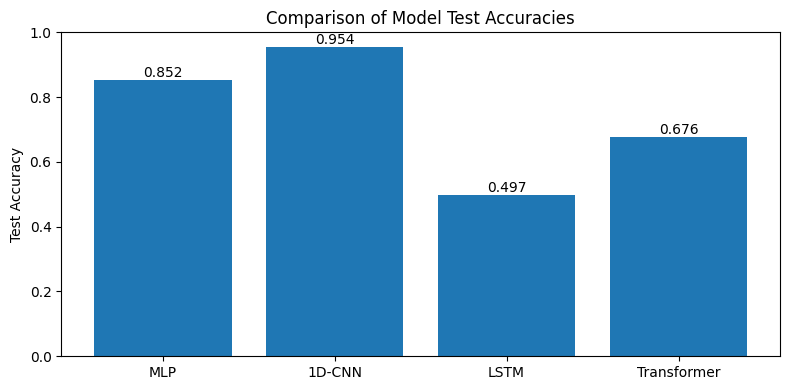

In [40]:
# after your model evaluations, you should have:
# test_acc_mlp, test_acc_cnn1d, test_acc_lstm, test_acc_transf

import matplotlib.pyplot as plt

models = ['MLP', '1D-CNN', 'LSTM', 'Transformer']
accuracies = [test_acc_mlp, test_acc_cnn1d, test_acc_lstm, test_acc_transf]

plt.figure(figsize=(8, 4))
plt.bar(models, accuracies)
plt.ylabel('Test Accuracy')
plt.title('Comparison of Model Test Accuracies')
for i, v in enumerate(accuracies):
    plt.text(i, v + 0.01, f'{v:.3f}', ha='center')  # annotate bars
plt.ylim(0, 1)
plt.tight_layout()
plt.show()
